# House prices prediction

The goal of this notebook is to work with the house prices data set assembled and published by Dean Decock in order to fit a predictive model of house prices. 
The dataset contains 2930 observations and 82 variables. It has been splitted into a train dataset containing 2430 observations and a test set containing the remaining 500 observations. 
The idea is to use the test dataset to fit our model(s) and to then validate our models on the data contained in the test set. 

This notebook will be organize as follow: 

1. Data cleaning 
2. Exploratory data analysis
3. Model fitting
4. Model evaluation and comparison
5. Conclusions

## 1. Data cleaning

In [1]:
# Loading libraries

import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import statsmodels.api as sm

As a first step, we split the variable per group. Indeed, the coding is not consistent throughout all categorical variables, with some being encoded with strings and others with integers. 
In order to load all data as they are intended, we will manually assign them their type when we load them with pandas, based on the info stored in the documentation.txt file. 

In [2]:
nomi_var = ["PID", "MS SubClass", "MS Zoning", "Street", "Alley", 
            "Land Contour", "Lot Config", "Neighborhood", "Condition 1", "Condition 2", 
            "Bldg Type", "House Style", "Roof Style", "Roof Matl", "Exterior 1st", 
            "Exterior 2nd", "Mas Vnr Type", "Foundation", "Heating", "Central Air", 
            "Garage Type", "Misc Feature", "Sale Type", "Sale Condition"
            ]
ordi_var = ["Lot Shape", "Utilities", "Land Slope", "Overall Qual", 
            "Overall Cond", "Exter Qual", "Exter Cond", "Bsmt Qual", 
            "Bsmt Cond", "Bsmt Exposure", "BsmtFin Type 1", "BsmtFin Type 2", 
            "Heating QC", "Electrical", "Kitchen Qual", "Functional", 
            "Fireplace Qu", "Garage Finish", "Garage Qual", "Garage Cond", 
            "Paved Drive", "Pool QC", "Fence"
           ]

conti_var = ["Lot Frontage", "Lot Area", "Mas Vnr Area", "BsmtFin SF 1", 
             "BsmtFin SF 2", "Bsmt Unf SF", "Total Bsmt SF", "1st Flr SF", 
             "2nd Flr SF", "Low Qual Fin SF", "Gr Liv Area", "Garage Area", 
             "Wood Deck SF", "Open Porch SF", "Enclosed Porch", "3Ssn Porch", 
             "Screen Porch", "Pool Area", "Misc Val", "SalePrice"
            ]

disc_var = ["Order", "Year Built", "Year Remod/Add", "Bsmt Full Bath", "Bsmt Half Bath", 
            "Full Bath", "Half Bath", "Bedroom AbvGr", "Kitchen AbvGr", "TotRms AbvGrd", 
            "Fireplaces", "Garage Yr Blt", "Garage Cars", "Mo Sold", "Yr Sold"
           ]

len(nomi_var + ordi_var + conti_var + disc_var)

82

In [3]:
# Loading data 
house_raw = pd.read_csv("house-prices.csv", dtype = 'object')
#house_raw[disc_var] = house_raw[disc_var].copy().astype(float).fillna(-999).astype(int) #filling NAs with -1 for integers
#house_raw[disc_var] = house_raw[disc_var].copy().astype(pd.Int64Dtype())#filling NAs with -1 for integers
house_raw[disc_var + conti_var] = house_raw[disc_var+ conti_var].copy().astype(float)
house_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2430 entries, 0 to 2429
Data columns (total 82 columns):
Order              2430 non-null float64
PID                2430 non-null object
MS SubClass        2430 non-null object
MS Zoning          2430 non-null object
Lot Frontage       2010 non-null float64
Lot Area           2430 non-null float64
Street             2430 non-null object
Alley              163 non-null object
Lot Shape          2430 non-null object
Land Contour       2430 non-null object
Utilities          2430 non-null object
Lot Config         2430 non-null object
Land Slope         2430 non-null object
Neighborhood       2430 non-null object
Condition 1        2430 non-null object
Condition 2        2430 non-null object
Bldg Type          2430 non-null object
House Style        2430 non-null object
Overall Qual       2430 non-null object
Overall Cond       2430 non-null object
Year Built         2430 non-null float64
Year Remod/Add     2430 non-null float64
Roof Styl

In order to prepare our data for the modeling task, we will first proceed with a global round of cleaning in order to identify possible errors in data entry(i.e.: impossible dates, typos leading to non existant categories, inconsistencies between related variables,etc.)

After this round of cleaning to ensure that all data is as expected, we will split the data. For this project, the data is already split into a training and a test set, with the test set being hold out in a separate file. However, we will split the data between a training and a validation set, where the training set will be used for exploratory data analysis, and training our models, while the validation set will be used to tune the hyper parameters of the model. 

### 1.1 General data cleaning
The goal of this section is to ensure all data are clean enough before analysis/feeding to the model. 
As a first step, we check if we have any duplicates in the dataset: 

In [4]:
print("{} duplicated observations in the dataset.".format(house_raw.duplicated().sum()))

0 duplicated observations in the dataset.


There are no duplicated observations in the dataset. Next, we will check for inconsistencies between related variables or data that are impossible and are the likely result of a mistake. If we encounter, any inconsistencies or values that are impossible, the data will be replaced with a missing value. However, for some of the variable, NA is not a missing value, but an actual category per se. In order to not create confusion, such variables will have their missing values replaced with a meaningful category instead of NA (example: "No_Pool"). 

In [5]:
categ_var_to_impute = ['Bsmt Qual',
 'Bsmt Cond',
 'BsmtFin Type 1',
 'BsmtFin Type 2',
 'Bsmt Exposure',
 'Garage Type',
 'Garage Finish',
 'Garage Cond',
 'Garage Qual',
 'Fireplace Qu',
 'Fence',
 'Alley',
 'Misc Feature',
 'Pool QC']

import re
NA_categs = ["No_" + re.search('([A-Z][a-z]+)', x).group(0) for x in categ_var_to_impute]
for idx, vari in enumerate(categ_var_to_impute): 
    house_raw[vari].fillna(NA_categs[idx], inplace = True)

The next step of our data cleaning is to check the categorical variables to ensure that the categories are as described in the documentation available with the data. 

In [6]:
for i in ordi_var: 
    print(i)
    print(house_raw[i].value_counts(dropna=False))
    print('===========================================================')

Lot Shape
Reg    1514
IR1     836
IR2      66
IR3      14
Name: Lot Shape, dtype: int64
Utilities
AllPub    2427
NoSewr       2
NoSeWa       1
Name: Utilities, dtype: int64
Land Slope
Gtl    2312
Mod     102
Sev      16
Name: Land Slope, dtype: int64
Overall Qual
5     690
6     608
7     503
8     277
4     181
9      96
3      35
10     24
2      12
1       4
Name: Overall Qual, dtype: int64
Overall Cond
5    1367
6     448
7     322
8     125
4      78
3      41
9      33
2      10
1       6
Name: Overall Cond, dtype: int64
Exter Qual
TA    1496
Gd     816
Ex      87
Fa      31
Name: Exter Qual, dtype: int64
Exter Cond
TA    2110
Gd     251
Fa      54
Ex      12
Po       3
Name: Exter Cond, dtype: int64
Bsmt Qual
TA         1062
Gd         1008
Ex          213
Fa           75
No_Bsmt      71
Po            1
Name: Bsmt Qual, dtype: int64
Bsmt Cond
TA         2170
Gd          101
Fa           82
No_Bsmt      71
Po            4
Ex            2
Name: Bsmt Cond, dtype: int64
Bsmt Exposur

In [7]:
for i in nomi_var[1:]: 
    print(i)
    print(house_raw[i].value_counts(dropna=False))
    print('===========================================================')

MS SubClass
20     912
60     470
50     231
120    159
30     119
70     107
160    103
80      94
90      86
190     55
85      41
75      19
45      15
180     14
40       4
150      1
Name: MS SubClass, dtype: int64
MS Zoning
RL         1894
RM          383
FV          113
RH           19
C (all)      17
I (all)       2
A (agr)       2
Name: MS Zoning, dtype: int64
Street
Pave    2419
Grvl      11
Name: Street, dtype: int64
Alley
No_Alley    2267
Grvl         104
Pave          59
Name: Alley, dtype: int64
Land Contour
Lvl    2176
Bnk     102
HLS      98
Low      54
Name: Land Contour, dtype: int64
Lot Config
Inside     1774
Corner      416
CulDSac     157
FR2          72
FR3          11
Name: Lot Config, dtype: int64
Neighborhood
NAmes      361
CollgCr    226
OldTown    209
Edwards    159
Somerst    151
Gilbert    135
NridgHt    134
Sawyer     128
NWAmes     121
SawyerW    102
Mitchel     99
BrkSide     89
Crawfor     79
IDOTRR      75
Timber      60
NoRidge     53
StoneBr     40
C

For both nominal and ordinal variables, there are no blatantly wrong data. All values are either exactly as in the documentation, or very close (e.g.: 'Wd Shng' instead of 'WdShing' in `Exterior  Second`) and the fact that all entries are within these particular categories are the same (instead of having a mix of the correct and incorrect phrasing for the entry) lets us think that the error might be  in the documentation (the documentation also has wrong writing for the variables sometimes).

On another note, we can see discrepancies in the Garage and Bsmt related variables. Indeed, we can see that we do not have the same number of observations with "No_Bsmt" in all Bsmt related variable (sometimes 71, sometimes 72, sometimes 74). The same goes for Garage, where we sometimes have 136 and sometimes 138 "No_Garage". This type of inconsistencies should be checked and corrected. 

In [8]:
# Investigate Garage
house_raw.loc[house_raw['Garage Qual'] == "No_Garage",
              ['Garage Cond','Garage Type',
               'Garage Finish']].apply(lambda x: x.value_counts())

,Garage Cond,Garage Type,Garage Finish
Detchd,NaN,2,NaN
No_Garage,138.0,136,138.0


In [9]:
house_raw.loc[(house_raw['Garage Cond'] == "No_Garage") & (house_raw['Garage Type'] == 'Detchd'), 
              ["PID", "Garage Cond", "Garage Type", "Garage Area", 'Garage Finish',
               'Garage Qual', "Garage Yr Blt", 'Garage Cars']]

,PID,Garage Cond,Garage Type,Garage Area,Garage Finish,Garage Qual,Garage Yr Blt,Garage Cars
1114,903426160,No_Garage,Detchd,360.0,No_Garage,No_Garage,NaN,1.0
1565,910201180,No_Garage,Detchd,NaN,No_Garage,No_Garage,NaN,NaN


We can see that 2 observations have No_Garage for most of the Garage related variables except Garage Type, where they have Detchd. One of the observations even has a numerical value for `Garage Area` and `Garage Cars`. 
Indeed, if we check the numerical values for continuous Garage related variables where Garage Cond = "No_Garage", we can see that instead of having all 0 or NA, Garage Area and Garage Cars, actually have non-null mean: 


In [10]:
house_raw.loc[house_raw['Garage Qual'] == "No_Garage", 
              ["Garage Area", "Garage Yr Blt", "Garage Cars"]].describe()

,Garage Area,Garage Yr Blt,Garage Cars
count,137.000000,0.0,137.000000
mean,2.627737,NaN,0.007299
std,30.756876,NaN,0.085436
min,0.000000,NaN,0.000000
25%,0.000000,NaN,0.000000
50%,0.000000,NaN,0.000000
75%,0.000000,NaN,0.000000
max,360.000000,NaN,1.000000


As we don't know what the correct information is, all garage-related variables will be replaced with missing values. 
We now investigate the Bsmt-related variables.

In [11]:
# Investigate Bsmt 
house_raw.loc[house_raw['BsmtFin Type 2'] == "No_Bsmt",
              ['Bsmt Qual','Bsmt Cond',
               'BsmtFin Type 1','Bsmt Exposure']].apply(lambda x: x.value_counts())

,Bsmt Qual,Bsmt Cond,BsmtFin Type 1,Bsmt Exposure
GLQ,NaN,NaN,1.0,NaN
Gd,1.0,NaN,NaN,NaN
No,NaN,NaN,NaN,1.0
No_Bsmt,71.0,71.0,71.0,71.0
TA,NaN,1.0,NaN,NaN


In [12]:
house_raw.loc[house_raw['Bsmt Exposure'] == "No_Bsmt",
              ['Bsmt Qual','Bsmt Cond',
               'BsmtFin Type 1','BsmtFin Type 2']].apply(lambda x: x.value_counts())

,Bsmt Qual,Bsmt Cond,BsmtFin Type 1,BsmtFin Type 2
Gd,3.0,NaN,NaN,NaN
No_Bsmt,71.0,71.0,71.0,71.0
TA,NaN,3.0,NaN,NaN
Unf,NaN,NaN,3.0,3.0


As mentionned earlier, not all Bsmt-related variables have a No_Bsmt value for some observations. If we check the continuous Bsmt-related variables, we can see that there also are some values that should be 0 as the observations are marked as No_Bsmt in some of the categorical variables. 

In [13]:
house_raw.loc[(house_raw['Bsmt Exposure'] == "No_Bsmt") & (house_raw['Bsmt Qual'] == "Gd"), 
              ['PID', 'Bsmt Exposure', 'Bsmt Qual','Bsmt Cond',
               'BsmtFin Type 1','BsmtFin Type 2', 
              "BsmtFin SF 1", "BsmtFin SF 2", "Bsmt Unf SF", 
               "Total Bsmt SF","Bsmt Full Bath", "Bsmt Half Bath"]]

,PID,Bsmt Exposure,Bsmt Qual,Bsmt Cond,BsmtFin Type 1,BsmtFin Type 2,BsmtFin SF 1,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Bsmt Full Bath,Bsmt Half Bath
875,528445060,No_Bsmt,Gd,TA,Unf,Unf,0.0,0.0,1595.0,1595.0,0.0,0.0
1681,528458090,No_Bsmt,Gd,TA,Unf,Unf,0.0,0.0,725.0,725.0,0.0,0.0
1726,907194130,No_Bsmt,Gd,TA,Unf,Unf,0.0,0.0,936.0,936.0,0.0,0.0


In [14]:
house_raw.loc[(house_raw['BsmtFin Type 2'] == "No_Bsmt") & (house_raw['Bsmt Qual'] == "Gd"), 
              ['PID', 'Bsmt Exposure', 'Bsmt Qual','Bsmt Cond',
               'BsmtFin Type 1','BsmtFin Type 2', 
               "BsmtFin SF 1", "BsmtFin SF 2", "Bsmt Unf SF", 
               "Total Bsmt SF","Bsmt Full Bath", "Bsmt Half Bath"]]

,PID,Bsmt Exposure,Bsmt Qual,Bsmt Cond,BsmtFin Type 1,BsmtFin Type 2,BsmtFin SF 1,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Bsmt Full Bath,Bsmt Half Bath
602,528142130,No,Gd,TA,GLQ,No_Bsmt,1124.0,479.0,1603.0,3206.0,1.0,0.0


The same treatment as for the Garage related variables will be applied. 
We now check consistencies for the other categorical variables having a continuous related variable. 

In [15]:
house_raw.loc[house_raw['Mas Vnr Type'] == "None", 
              ['Mas Vnr Type', "Mas Vnr Area"]].describe()

,Mas Vnr Area
count,1442.000000
mean,0.854369
std,16.213346
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,344.000000


Mas Vnr Area should have a mean value of 0 when Mas Vnr Type is None. This means that we have some observations with inconsistencies between these two variables. 

In [16]:
house_raw.loc[(house_raw['Mas Vnr Type'] == "None") & (house_raw['Mas Vnr Area'] > 0), 
              ['Mas Vnr Type', "Mas Vnr Area"]]

,Mas Vnr Type,Mas Vnr Area
631,None,285.0
1286,None,1.0
1546,None,344.0
1737,None,312.0
1975,None,1.0
2135,None,288.0
2256,None,1.0


The same treatment as for the Garage and Bsmt related variables inconsistencies will be applied. 

In [17]:
house_raw.loc[house_raw['Fireplace Qu'] == "No_Fireplace", 
              ['Fireplace Qu', 'Fireplaces']].describe()

,Fireplaces
count,1186.0
mean,0.0
std,0.0
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,0.0


No inconsistencies to note.

In [18]:
house_raw.loc[house_raw['Misc Feature'] == "No_Misc", 
              ['Misc Feature', 'Misc Val']].describe()

,Misc Val
count,2340.0
mean,0.0
std,0.0
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,0.0


No inconsistencies to note. 

In [19]:
house_raw.loc[house_raw['Pool QC'] == "No_Pool", 
              ['Pool QC', 'Pool Area']].describe()

,Pool Area
count,2418.0
mean,0.0
std,0.0
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,0.0


No inconsistencies to note.
Finally, we check the quantitative variables for impossible values. For Years related varivables, we will check if all values are less or equal to 2010, as this file concerns sales between 2006 and 2010. Exception is for "Year Sold", for which we will check if all values are between 2006 and 2010. 
For the other quantitative variables, as this is not a search for outliers yet, we will simply check for negative values, with an exception for Month sold, where we will check that all values are between 1 and 12.  

In [20]:
# Investigate Year variables
year_var = ["Year Built", "Year Remod/Add","Garage Yr Blt"]

for i in year_var:
    if house_raw[i].max() > 2010: 
        print(i + " has at least one value after 2010")
        

Garage Yr Blt has at least one value after 2010


In [21]:
house_raw["Yr Sold"].value_counts()

2007.0    584
2008.0    530
2009.0    518
2006.0    514
2010.0    284
Name: Yr Sold, dtype: int64

In [22]:
house_raw["Mo Sold"].value_counts()

6.0     422
7.0     374
5.0     335
4.0     227
3.0     187
8.0     186
10.0    143
9.0     135
11.0    112
2.0     109
1.0     108
12.0     92
Name: Mo Sold, dtype: int64

As we can see, Garage Yr Blt is the only variable with at least one value > 2010. This value will be replaced with a missing value. 
For Yr Sold and Mo Sold, we can see that all values are as expected. 

In [23]:
# investigate all other quantitative variables. 
for i in conti_var + disc_var:
    if house_raw[i].min() < 0: 
        print(i + " has at least one negative value")
        

No negative values in the quantitative variables. 
Now that we have checked for all inconsistencies and impossible values, we will replace all these errors in the dataset with missing values. To account for the fact that these types of errors in the data might happen in other variables than the one where we observed them in the test set, we will make create a function that checks and replace generally for all variables and not only for the variables with actual mistakes in the training set. 

In [24]:
# replacing inconsistent data with missing values
def consistency_check(data, categ_var, quanti_var = []):    
    df = data.copy()
    all_var = categ_var + quanti_var
    # define the No_xxx category to check for
    No = "No_" + re.search('([A-Z][a-z]+)', categ_var[0]).group(0)
    # find inconsistent rows within this group of variables
    idx = (df[categ_var].eq(No).sum(axis = 1).ne(0)) & ((df[categ_var].eq(No).sum(axis = 1).ne(len(categ_var))) | (np.abs(df[quanti_var]).gt(0).sum(axis = 1).gt(0))) 
    # replace inconsistencies with na
    df.loc[idx, all_var] = np.nan
    return df


# recoding NA for variables associated to categ variables with No_xxx or None
# after correcting inconsistent data
# to be sure they are 0 and not NA
def recod_quantiNA_0(data, categ_var, quanti_var):
    df = data.copy()
    # define the No_xxx category to check for
    No = "No_" + re.search('([A-Z][a-z]+)', categ_var[0]).group(0)
    idx = (df[categ_var[0]].eq(No)) | (df[categ_var[0]].eq('None'))
    # make sure its 0
    df.loc[idx, quanti_var] = 0 
    return df



In [25]:
# Replace inconsistent values with na
class_var_categ = [['Bsmt Exposure', 'Bsmt Qual','Bsmt Cond',
                    'BsmtFin Type 1','BsmtFin Type 2'], 
                   ["Garage Cond", "Garage Type", 'Garage Finish',
                    'Garage Qual'], ["Fireplace Qu"], 
                   ["Misc Feature"], 
                   ["Pool QC"], 
                   ["Mas Vnr Type"]
                  ]

class_var_quanti = [["BsmtFin SF 1", "BsmtFin SF 2", "Bsmt Unf SF", 
                     "Total Bsmt SF","Bsmt Full Bath", "Bsmt Half Bath"], 
                    ["Garage Area"], ["Fireplaces"],
                    ["Misc Val"], 
                    ["Pool Area"], 
                    ["Mas Vnr Area"]
                   ]
house_clean = house_raw.copy()
for cat,quant in zip(class_var_categ, class_var_quanti): 
    house_clean = consistency_check(data = house_clean, categ_var = cat, quanti_var = quant)
    house_clean = recod_quantiNA_0(data = house_clean, categ_var = cat, quanti_var = quant)

for quant in disc_var + conti_var: 
    house_clean.loc[house_clean[quant] <0, quant] = np.nan
    if quant == "Mo Sold": 
        house_clean.loc[(house_clean[quant] <1) | (house_clean[quant] >12), quant] = np.nan
    if quant == "Yr Sold": 
        house_clean.loc[(house_clean[quant] <2006) | (house_clean[quant] >2010), quant] = np.nan
    if quant in year_var: 
        house_clean.loc[house_clean[quant] >2010, quant] = np.nan

Let's perform a few check on some of the variables to ensure the replacement worked as expected:

In [26]:
# checking for inconsistencies after cleaning: 
house_clean["Garage Yr Blt"].max()

2010.0

In [27]:
house_clean.loc[house_clean['BsmtFin Type 2'] == "No_Bsmt",
              ['Bsmt Qual','Bsmt Cond',
               'BsmtFin Type 1','Bsmt Exposure']].apply(lambda x: x.value_counts())

,Bsmt Qual,Bsmt Cond,BsmtFin Type 1,Bsmt Exposure
No_Bsmt,71,71,71,71


In [28]:
house_clean.loc[(house_clean['Mas Vnr Type'] == "None") & (house_clean['Mas Vnr Area'] > 0), 
              ['Mas Vnr Type', "Mas Vnr Area"]]

,Mas Vnr Type,Mas Vnr Area


Now, that the data are generally cleaned and without obvious wrong data, we will proceed with the rest of the data preparation. First, we will split the data into a training and a validation set. The training set will be used to investigate missing data and define rules for their imputations and the detection of outliers that will then be used to perform the same preprocessing on the validation and test set, without risking data leakage. 
The validation set will be used to tune the hyperparameters of our different models. 

In [29]:
from sklearn.model_selection import train_test_split

house_clean_tr, house_clean_val = train_test_split(house_clean, test_size=0.3, random_state=18072021)

#### Investigating discrete variables:

We will first investigate discrete variables by displaying their distributions. 

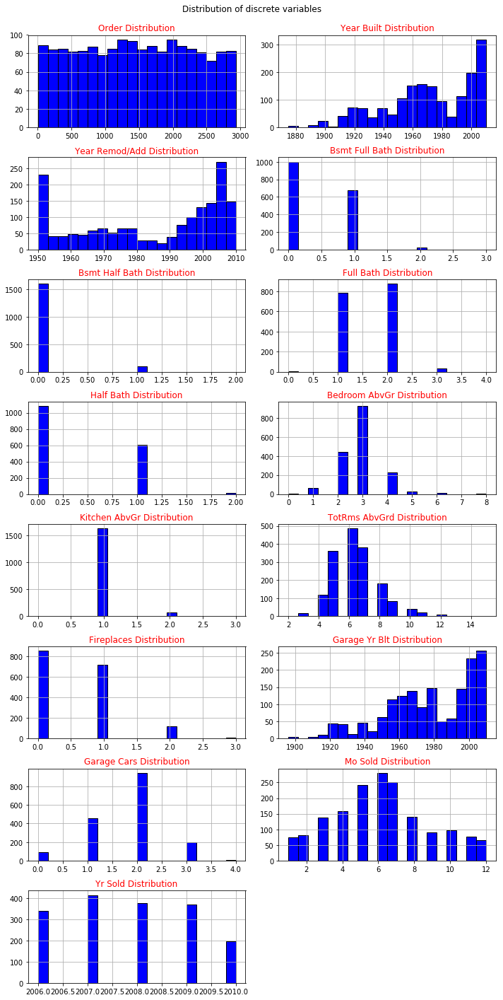

In [30]:
fig=plt.figure(figsize=(10,20))
for i, feature in enumerate(disc_var):
    ax=fig.add_subplot(1 + (len(disc_var)/2),2,i+1)
    house_clean_tr[feature].hist(bins=20,ax=ax,facecolor='blue', edgecolor = 'black')
    #ax.boxplot(food_clean[feature].dropna())
    ax.set_title(feature+" Distribution",color='red')

fig.tight_layout()  
plt.suptitle("Distribution of discrete variables")
plt.subplots_adjust(top=0.95)
plt.show()


We can see that except for `Year Built`, `Year ReMod/Add` and `Garage Yr Blt` variables, the number of categories per discrete variables is relatively low (< 15). When this is the case for discrete variables, it means that these variables cannot be approximated to continuous variables easily and would benefit from being considered as ordinal variables.

We can also note that for almost all of the discrete variables, the distribution of the data is not equal among the categories, with some having less than 5% of the data. 
This is a first indication that for categories with low number of observations, the predictions might be inacurate, and variables with more even distributions might be better choices to consider for our simple and moderately complex models. 

We now focus on exploring the distributions of continuous variables.
Our first approach is to display all continuous variables distributions: 

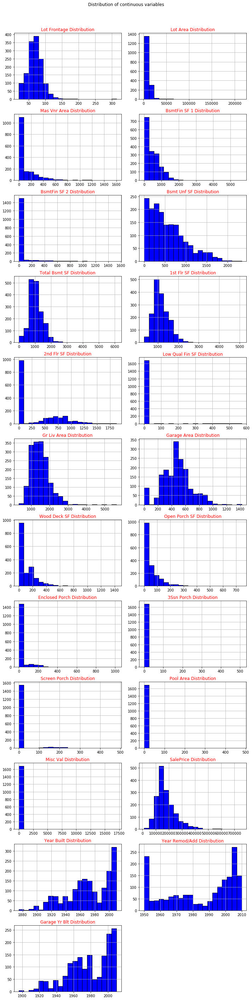

In [31]:
true_conti_var = conti_var + ["Year Built","Year Remod/Add","Garage Yr Blt"]

fig=plt.figure(figsize=(10,40))
for i, feature in enumerate(true_conti_var):
    ax=fig.add_subplot(1 + (len(true_conti_var)/2),2,i+1)
    house_clean_tr[feature].hist(bins=20,ax=ax,facecolor='blue', edgecolor = 'black')
    #ax.boxplot(food_clean[feature].dropna())
    ax.set_title(feature+" Distribution",color='red')

fig.tight_layout()  
plt.suptitle("Distribution of continuous variables")
plt.subplots_adjust(top=0.95)
plt.show()



A lot of these variables present a high  number of O values, which are due to the fact that the corresponding feature being measured is absent for these observations. This is something that will be delt in the feature enginneering part of this notebook. For now, we are interested in the distribution of the non-null values. 

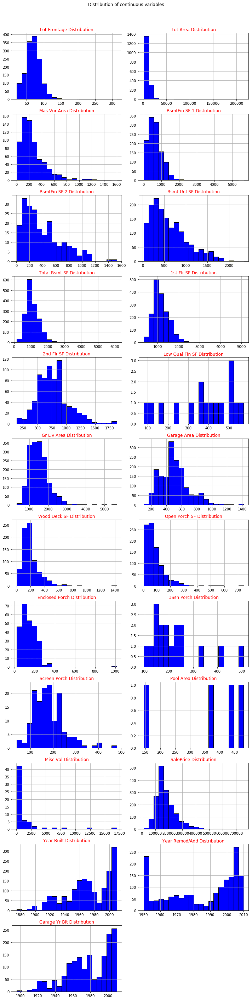

In [32]:
fig=plt.figure(figsize=(10,40))
for i, feature in enumerate(true_conti_var):
    ax=fig.add_subplot(1 + (len(true_conti_var)/2),2,i+1)
    house_clean_tr.loc[house_clean_tr[feature] != 0, feature].hist(bins=20,ax=ax,facecolor='blue', edgecolor = 'black')
    #ax.boxplot(food_clean[feature].dropna())
    ax.set_title(feature+" Distribution",color='red')

fig.tight_layout()  
plt.suptitle("Distribution of continuous variables")
plt.subplots_adjust(top=0.95)
plt.show()



Except for the Year variables, most of the variables present a skewed distribution, with a heavy tail.  This means that using the z-scores to try to highlight the outliers on several of them wouldn't work very well. In order to circumvent this issue, we try to transform the variables that can be transformed. 
In particular, some of these look like a log transformation could result in a normally distributed transformed variable: 


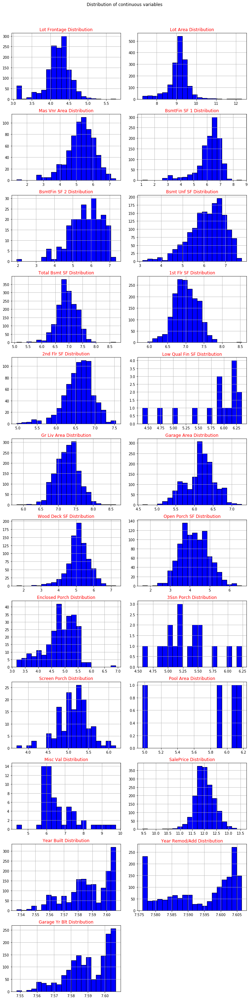

In [33]:
fig=plt.figure(figsize=(10,40))
for i, feature in enumerate(true_conti_var):
    ax=fig.add_subplot(1 + (len(true_conti_var)/2),2,i+1)
    np.log1p(house_clean_tr.loc[house_clean_tr[feature] != 0 ,feature]).hist(bins=20,ax=ax,facecolor='blue', edgecolor = 'black')
    #np.log1p(house_clean[feature]).hist(bins=20,ax=ax,facecolor='blue', edgecolor = 'black')
    #ax.boxplot(food_clean[feature].dropna())
    ax.set_title(feature+" Distribution",color='red')

fig.tight_layout()  
plt.suptitle("Distribution of continuous variables")
plt.subplots_adjust(top=0.95)
plt.show()

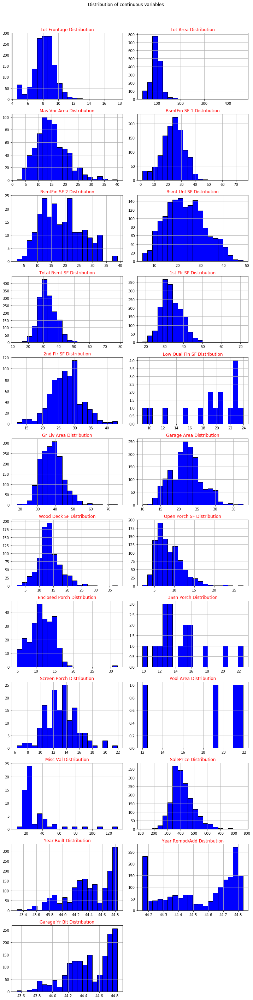

In [34]:
fig=plt.figure(figsize=(10,40))
for i, feature in enumerate(true_conti_var):
    ax=fig.add_subplot(1 + (len(true_conti_var)/2),2,i+1)
    np.sqrt(house_clean_tr.loc[house_clean_tr[feature] != 0 ,feature]).hist(bins=20,ax=ax,facecolor='blue', edgecolor = 'black')
    #np.log1p(house_clean[feature]).hist(bins=20,ax=ax,facecolor='blue', edgecolor = 'black')
    #ax.boxplot(food_clean[feature].dropna())
    ax.set_title(feature+" Distribution",color='red')

fig.tight_layout()  
plt.suptitle("Distribution of continuous variables")
plt.subplots_adjust(top=0.95)
plt.show()

TO DO: correct above plots. 

In order to identify potential outliers, and as a first step to identify continuous variables with a linear relationship with the target variable, we will now display plots of the continuous variables against the sales price. 
As established earlier, some of these variables have a large amount of 0 values. We will thus exclude the 0 for these plots and study the nature of the relationship between the target value and the non negative values. 

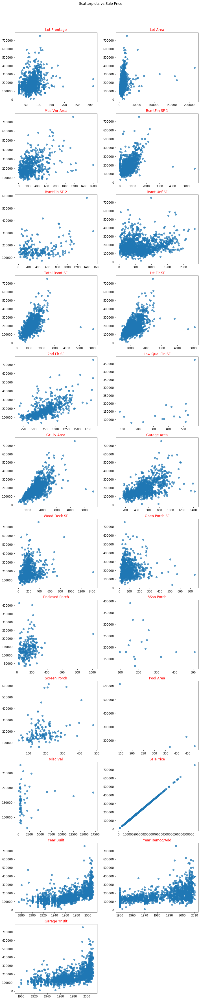

In [35]:
# Plotting discrete variables vs Sale Price to identify visually if we have outliers
#normal_var = ["Lot Frontage", "Total Bsmt SF", "1st Flr SF", "2nd Flr SF", "Gr Liv Area", "Garage Area", "SalePrice"]
#true_conti_var.remove("SalePrice")
fig=plt.figure(figsize=(10,50))

for i, feature in enumerate(true_conti_var):
    ax=fig.add_subplot(1+(len(true_conti_var)/2),2,i+1)
    plt.scatter(house_clean_tr.loc[house_clean_tr[feature] > 0, feature], house_clean_tr.loc[house_clean_tr[feature] > 0, "SalePrice"], alpha = 0.7, label = "data")
    ax.set_title(feature,color='red')

fig.tight_layout()  
plt.suptitle("Scatterplots vs Sale Price")
plt.subplots_adjust(top=0.95)
plt.show()

We can see that for some of the variables, some observations are outside of the joint distribution between the independant variable and SalePrice.  We have the choice between keeping these observations as they are and keep in mind that they exists throughout the process, or to remove them. Dealing with outliers is always a delicate issue. Removing observations is generally not advised, especially with outliers that could be the result of errors or be genuine observations that are the result of underlying effects that we are not aware of. However, these outlying observations might cause issues to our future models as they might cause our future models to give too much weigh to extreme values, resulting in poor predictive values in general. Ultimately, what is an outlier and how to deal with those relies on expertise on the domain. 

For this project, we make the choice to remove outliers.
Based on the visual inspection of the above scatter plots, we manually set thresholds for each variables inorder to keep as much of the original data as possible. These thresholds set on the training set will also be used on the validation set and later on, on the test set. 

Specifically, we will flag as outliers and remove data that are: 
* Lot Frontage > 210
* Total Bsmt SF > 3 100
* 1st Flr SF > 3 000
* Gr Liv Area > 3 000
* SalePrice > 700 000
* Lot Area > 75 000
* BsmtFin SF 2 > 1 200 
* BsmtFin SF 1 > 2 500
* Wood Deck SF > 1 300
* Open Porch SF > 600
* Enclosed Porch > 500

For all of these variables, the outliers will be replaced with missing values. 

In [36]:
def remove_outliers(df): 
    new_df = df.copy()
    new_df.loc[new_df["Lot Frontage"]>210, "Lot Frontage"] = np.nan
    new_df.loc[new_df["Total Bsmt SF"]>3100, "Total Bsmt SF"] = np.nan
    new_df.loc[new_df["1st Flr SF"]>3000, "1st Flr SF"] = np.nan
    new_df.loc[new_df["Gr Liv Area"]>3000, "Gr Liv Area"] = np.nan
    new_df.loc[new_df["SalePrice"]>700000, "SalePrice"] = np.nan
    new_df.loc[new_df["Lot Area"]>75000, "Lot Area"] = np.nan
    new_df.loc[new_df["BsmtFin SF 2"]>1200, "BsmtFin SF 2"] = np.nan
    new_df.loc[new_df["BsmtFin SF 1"]>2500, "BsmtFin SF 1"] = np.nan
    new_df.loc[new_df["Wood Deck SF"]>1300, "Wood Deck SF"] = np.nan
    new_df.loc[new_df["Open Porch SF"]>600, "Open Porch SF"] = np.nan
    new_df.loc[new_df["Enclosed Porch"]>500, "Enclosed Porch"] = np.nan
    new_df.loc[new_df["Year Built"]>2010, "Year Built"] = np.nan
    new_df.loc[new_df["Year Remod/Add"]>2010, "Year Remod/Add"] = np.nan
    new_df.loc[new_df["Garage Yr Blt"]>2010, "Garage Yr Blt"] = np.nan
    return new_df

In [37]:
house_clean_tr = remove_outliers(house_clean_tr)

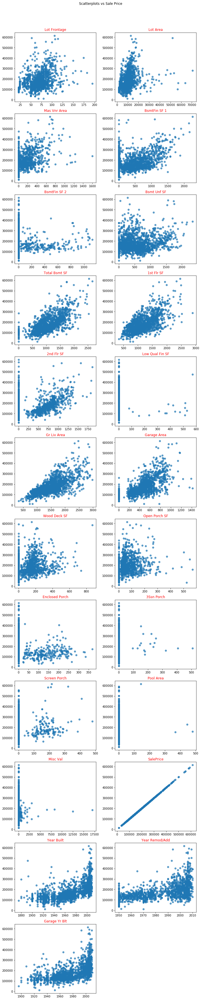

In [38]:
fig=plt.figure(figsize=(10,50))
for i, feature in enumerate(true_conti_var):
    ax=fig.add_subplot(1+(len(true_conti_var)/2),2,i+1)
    plt.scatter(house_clean_tr[feature], house_clean_tr["SalePrice"], alpha = 0.7, label = "data")
    #ax.boxplot(food_clean[feature].dropna())
    ax.set_title(feature,color='red')

fig.tight_layout()  
plt.suptitle("Scatterplots vs Sale Price")
plt.subplots_adjust(top=0.95)
plt.show()

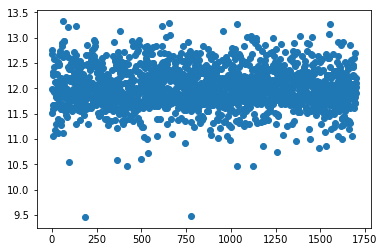

In [39]:
plt.scatter(range(0,house_clean_tr.shape[0]), np.log1p(house_clean_tr.SalePrice))
plt.show()

The cleaning of the dataset is almost done. Troughout the process, we have replaced missing values with a true meaning with a new category and removed values that were either non consistent, completely wrong or abnormally large. The final percentage of missing values after this process is: 

In [40]:
print("{}% of the values are missing in the cleaned dataset".format(round(((house_clean_tr.isna()) ==True).sum().sum()*100/(house_clean_tr.shape[0]*house_clean_tr.shape[1]), 2)))



0.34% of the values are missing in the cleaned dataset


In [41]:
### Compute and sort proportion of NAs per column

prop_NA_col = ((house_clean_tr.isna()) ==True).sum()*100 / house_clean_tr.shape[0]
prop_NA_col.sort_values(ascending = True, inplace = True)
all_prop_NA_col_df = pd.DataFrame(prop_NA_col, columns = ["Proportion of NAs"])
prop_NA_col_df = all_prop_NA_col_df.loc[all_prop_NA_col_df["Proportion of NAs"] >0]
dtypes_df = pd.DataFrame(house_clean.dtypes, columns = ["dtypes"]).reindex(prop_NA_col_df.index)
dtypes_df["dtypes"] = dtypes_df["dtypes"].apply(lambda x: str(x))

In [42]:
# Unique category labels: 'D', 'F', 'G', ...
color_labels = dtypes_df['dtypes'].unique()

# List of RGB triplets
rgb_values = sns.color_palette("Set2", 8)

# Map label to RGB
color_map = dict(zip(color_labels, rgb_values))

       
labels = [str(x) for x in list(color_map.keys())]
handles = [plt.Rectangle((0,0),1,1, color=color_map[label]) for label in labels]

dtypes_df["color"] = dtypes_df["dtypes"].map(color_map)
dtypes_df.head()



,dtypes,color
Wood Deck SF,float64,"(0.4, 0.7607843137254902, 0.6470588235294118)"
Garage Area,float64,"(0.4, 0.7607843137254902, 0.6470588235294118)"
Garage Qual,object,"(0.9882352941176471, 0.5529411764705883, 0.384..."
Garage Cond,object,"(0.9882352941176471, 0.5529411764705883, 0.384..."
Open Porch SF,float64,"(0.4, 0.7607843137254902, 0.6470588235294118)"


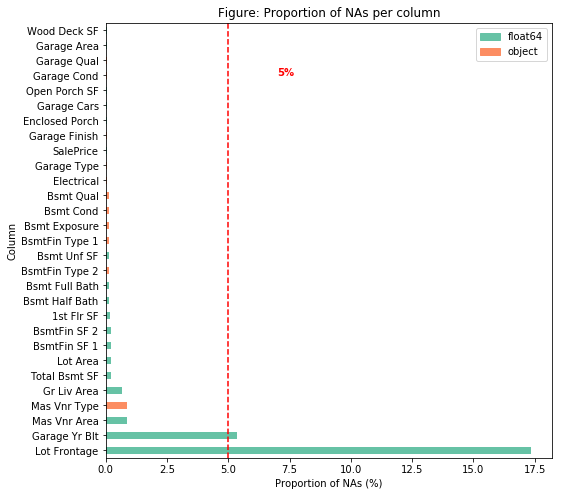

In [43]:
plt.figure(figsize=(8,8))
#colormap = plt.cm.tab20(range(0, 10))
barplot = prop_NA_col_df["Proportion of NAs"].plot.barh(color = dtypes_df["color"])
barplot.set_title('Figure: Proportion of NAs per column')
barplot.set_xlabel('Proportion of NAs (%)')
barplot.set_ylabel('Column')
barplot.invert_yaxis()
barplot.axvline(x=5, linestyle = '--', color = 'red')
barplot.text(7, 3, '5%', color = 'red', fontweight = 'bold')
plt.legend(handles, labels)
plt.show()

The global percentage of missing values after the first cleaning process is only 0.35% with only a few variablesconcerned with these. 
Considering this small percentage, we will use a simple method to impute the missing values, as they will most likely not have a great impact on the analysis. 
For categorical and discrete variables, we will replace missing values with the mode of each variable. For the continuous variables, as we have established that most of them don't follow a normal distribution, we will replace missing values with the median of non-zero values instead of the mean. 
During this process, we will ensure that consistency between related variable is kept (not assigning values for Pool area if we assign No_Pool to PoolQC for example). 

In [44]:
def impute_NA(df, related_categ, related_conti):
    df_copy = df.copy()
    # 1) impute related first
    for cat,quant in zip(related_categ, related_conti): 
        df_copy[cat].fillna(df_copy[cat].apply(lambda x: x.mode().values), inplace = True)
        for sub_quant in quant: 
            df_copy.loc[df_copy[cat[0]].str.contains(r'^No_.+$', na=False) & 
                                df_copy[sub_quant].isna()
                               ,sub_quant] = df_copy.loc[df_copy[cat[0]].str.contains(r'^No_.+$', na=False) & 
                                df_copy[sub_quant].isna()
                               ,sub_quant].fillna(0)
    df_copy.loc[:, disc_var + nomi_var + ordi_var]= df_copy.loc[:, disc_var + nomi_var + ordi_var].fillna(df_copy[disc_var + nomi_var + ordi_var].apply(lambda x: x.mode().values[0]))
    df_copy.loc[:, conti_var] = df_copy.loc[:, conti_var].fillna(df_copy[conti_var].apply(lambda x: x[x>0].median()))
    return(df_copy)
        
    
    
    

In [45]:
house_clean_tr_noNA = impute_NA(house_clean_tr, class_var_categ, class_var_quanti)

/Users/Umbre/opt/anaconda3/envs/exts-ml/lib/python3.6/site-packages/pandas/core/frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


In [46]:
print('{} missing values remaining in dataset'.format(house_clean_tr_noNA.isna().sum().sum()))

0 missing values remaining in dataset


## Exploratory data analysis

### Univariate analysis

Now that we have a clean dataset, we will perform a quick exploratory step: 
Thi sstep will have 2 main goals: 
* First, define which variables are more likely to be worth pursuing to establish our predictive model of the Sales Prices
* Second, define prepare the feature engineering step prior to the modelisation, in order to investigate which transformation is needed for our variables before we include them in our model. 

#### Linear model assumptions
We will start with the quantitative variables. 
Our first step will be to determine if a linear relationship exists between the continuous variables and SalesPrice. 
To this end, we will work one variable at a time, compute a linear regression between them and SalesPrice and then study the residuals to determine if the linear regression assumptions are met.
The assumptions are: 
1. Independance of the observations: This is difficult to actually prove, and we have to assume that the process to collect the data ensured that the observations are independant from one another
2. Linearity of the relationship between the dependant and the independant variable. 
3. Homoscedasticity of the residuals: the error is evenly distributed along the values of both the dependant and independant variable (we don't make more errors when the Prices are higher for example)
4. Normality of the residuals: the error is normally distributed. 
If not, we will try to apply the necessary transformations to the variables to ensure it. 

#### 0 inflated variables
In the case of the 0 inflated variables, we will implement a new binary variable (for example: No_Parch/ Porch ) that will be used to work around the non linearity introduced by the 0 values. 
Basically, for these variables, we will be computing the following model: 

$$\hat{Y} = \hat{\beta}_{0} + \hat{\beta}_{1}X_{1} + \hat{\beta}_{2}X_{2} $$

Where: 

$\hat{Y}$ is SalesPrice

$X_{1}$ is the original continuous variable

$
X_{2} = \left\{
    \begin{array}\\
        1 & \mbox{if } \ X_{1} = 0 \\
        0 & \mbox{else.}
    \end{array}
\right.
$

$\hat{\beta}_{0}$ is the average value of sales price in the dataset 

$\hat{\beta}_{1}$ is the estimated effect of the original variable (for example, the effect of the size area of the Enclosed Porch)

$\hat{\beta}_{2}$ is the estimated effect of not having the corresponding feature (for example, not having an Enclosed Porch) vs.  having the feature. 


As a first step, we fit the model with each of the continuous variables without transformation and have a look at the diagnostic plots: 
* Scatter plot of the data with the predicted values overlapped to establish if the relationship is linear
* Histogram of the residuals and quantile-quantile plot to study their distribution
* Scatter plot of the residuals vs. the predicted values to study the homoscedasticity of the residuals 



In [47]:
# Fit a linear regression
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import HuberRegressor
from scipy.stats import probplot

z_inf_variables = ["BsmtFin SF 1", "BsmtFin SF 2", "Bsmt Unf SF", 
                   "Total Bsmt SF","2nd Flr SF" , "Low Qual Fin SF", 
                   "Garage Area", "Wood Deck SF", " Open Porch SF", 
                   "Enclosed Porch SF", "Screen Porch", "3Ssn Porch",
                   "Misc Val", "Pool Area", "Mas Vnr Area"                 
                  ]
                   


def diagplots(IV, target, df, degree = 1):
    X = pd.DataFrame({'{}_{}'.format(IV, x): df[IV]**x for x in range(1, degree+1)})
    if IV in z_inf_variables: 
        X["Y/N"] = [1 if x ==0 else 0 for x in df[IV]]
    y = df[target].values
    fig, axes = plt.subplots(2, 2, figsize=(20,20))
    lr = LinearRegression()
    #lr = HuberRegressor()

    # Fit the model
    lr.fit(X, y)
     
    # and the predictions
    y_pred_lr = lr.predict(X)
    residuals = y - y_pred_lr
    axes[0,0].scatter(df[IV],y, alpha = 0.3, label = "data")
    axes[0,0].scatter(df[IV],y_pred_lr, alpha = 0.3, label = "predictions")
    axes[0,0].set_title('{} vs. {}'.format(IV, target))
    axes[0,0].set_xlabel(IV)
    axes[0,0].set_ylabel(target)
    axes[0,0].legend()
    
    #2) residuals histogram
    axes[0,1].hist(residuals, bins = 20)
    axes[0,1].set_title("Histogram of residuals")

    #3) residuals vs fitted
    axes[1,0].scatter(y_pred_lr, residuals )
    axes[1,0].axhline(0, c = 'r')
    axes[1,0].set_title("Residuals vs predictions")
    axes[1,0].set_xlabel("Predictions")
    axes[1,0].set_ylabel("Residuals")
    
    #4) residuals qqplot
    axes[1,1] = probplot(residuals, dist="norm", plot = plt);
    fig.suptitle(IV)
    plt.show()
    return 

#diagplots("Mas Vnr Area", "SalePrice", house_clean_tr_noNA, degree = 1)
    

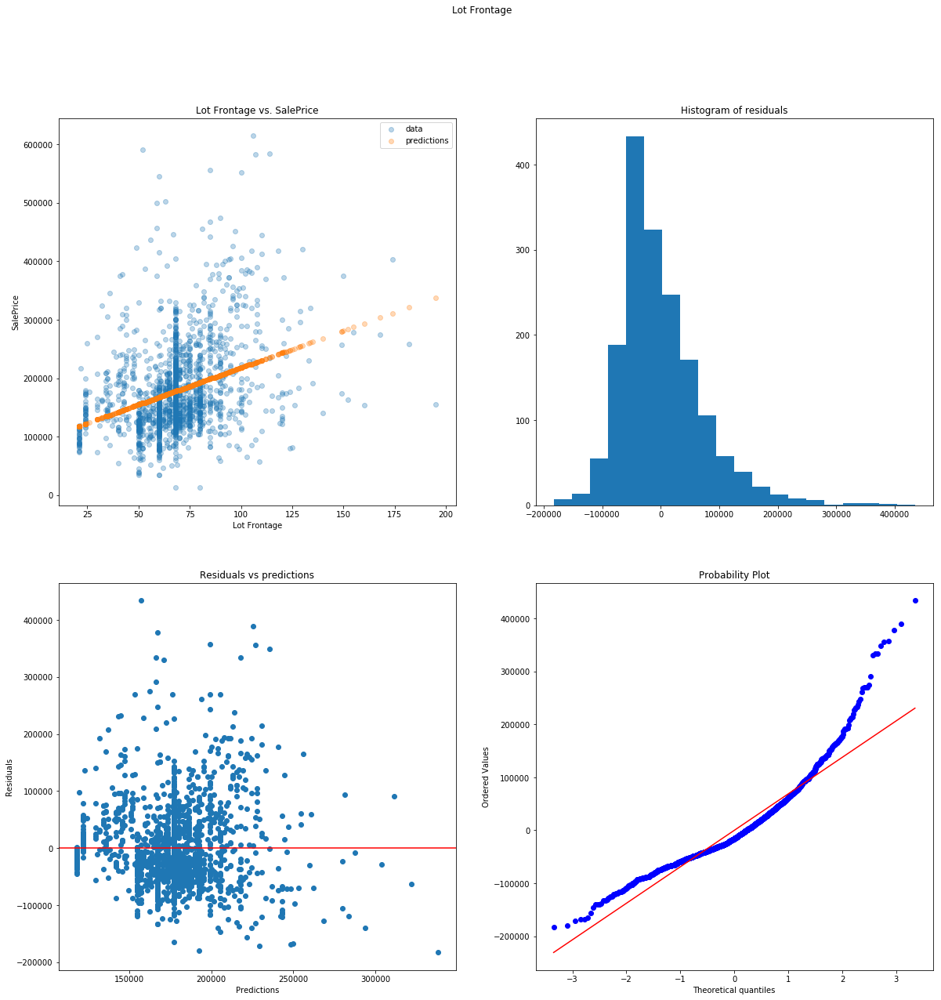

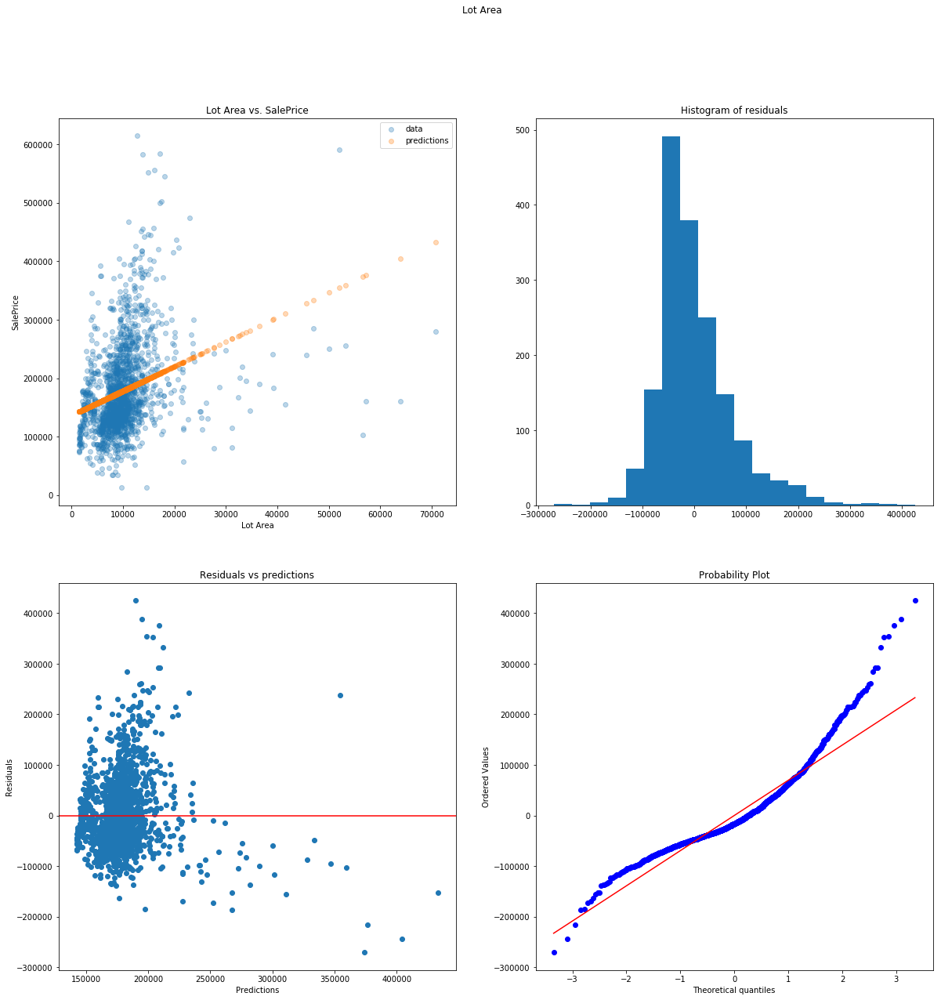

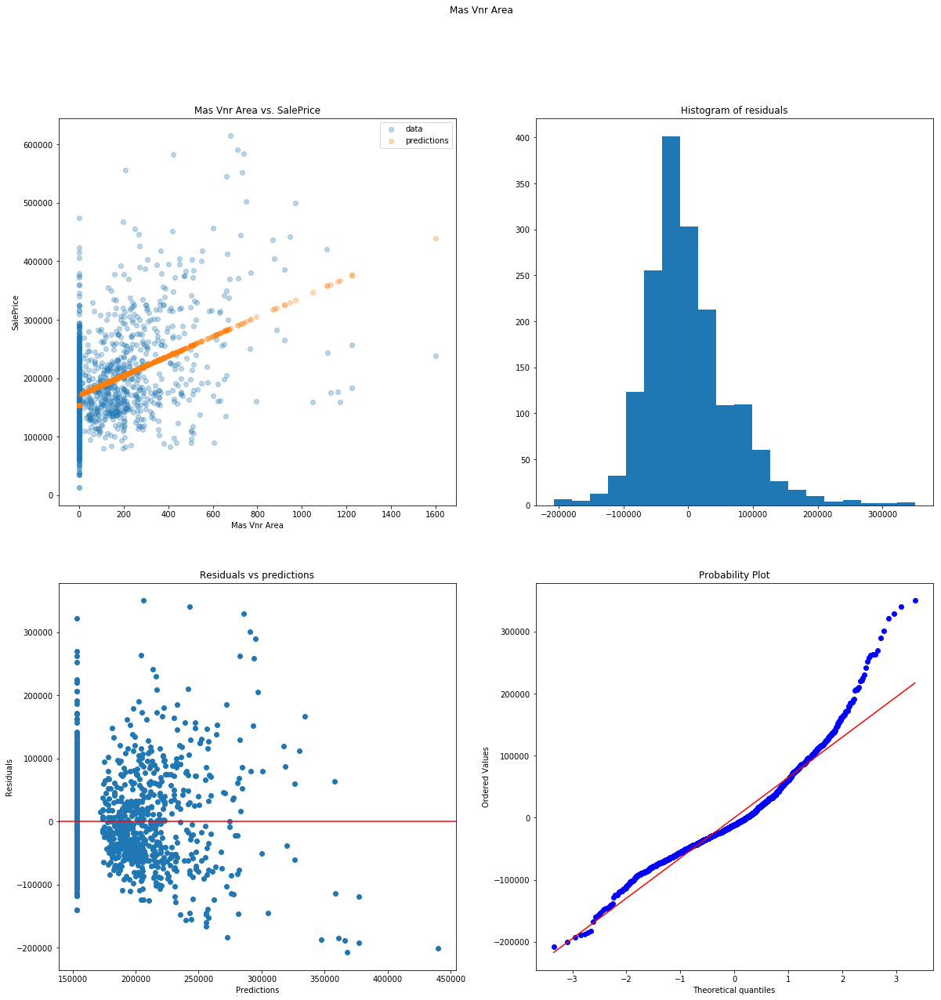

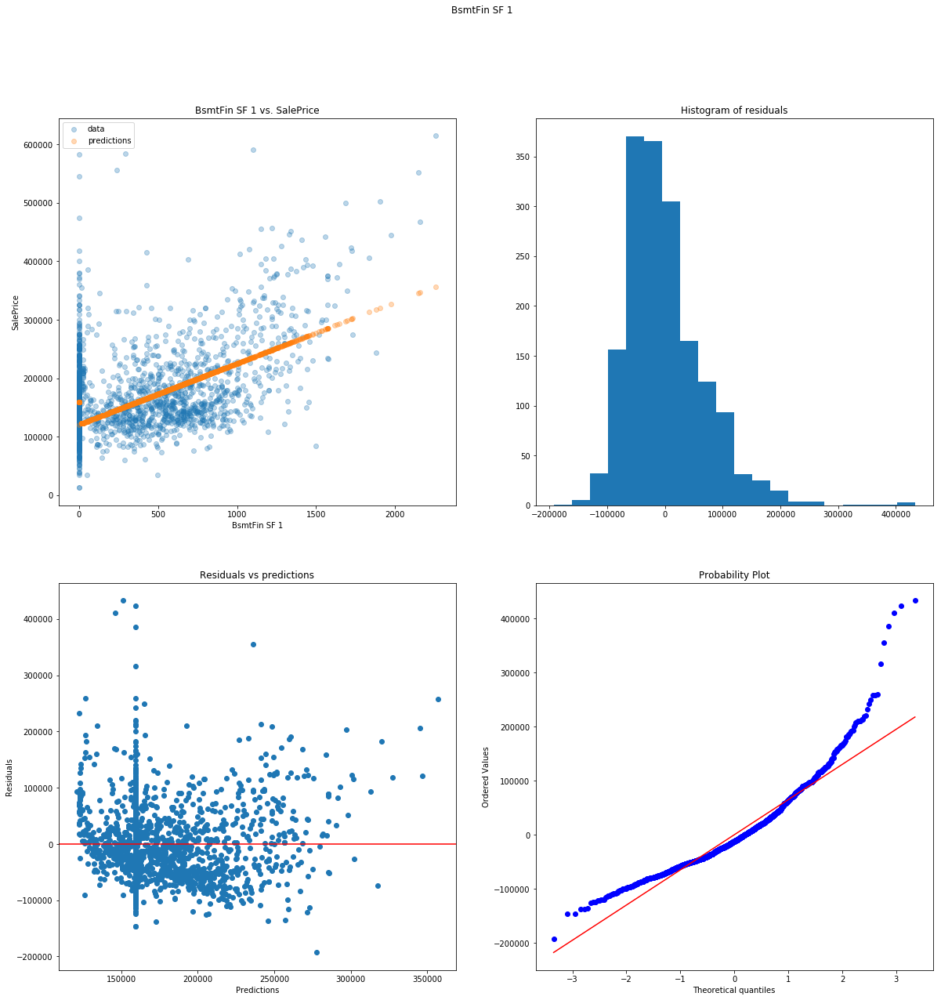

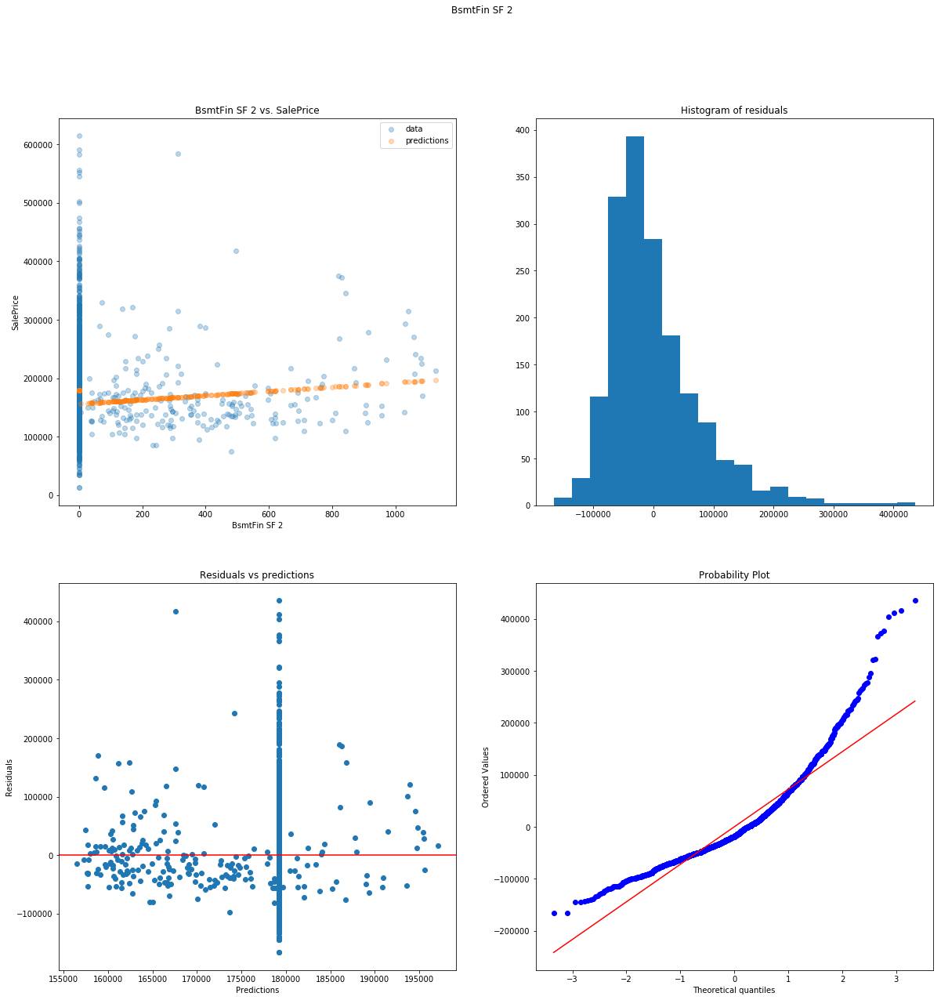

...

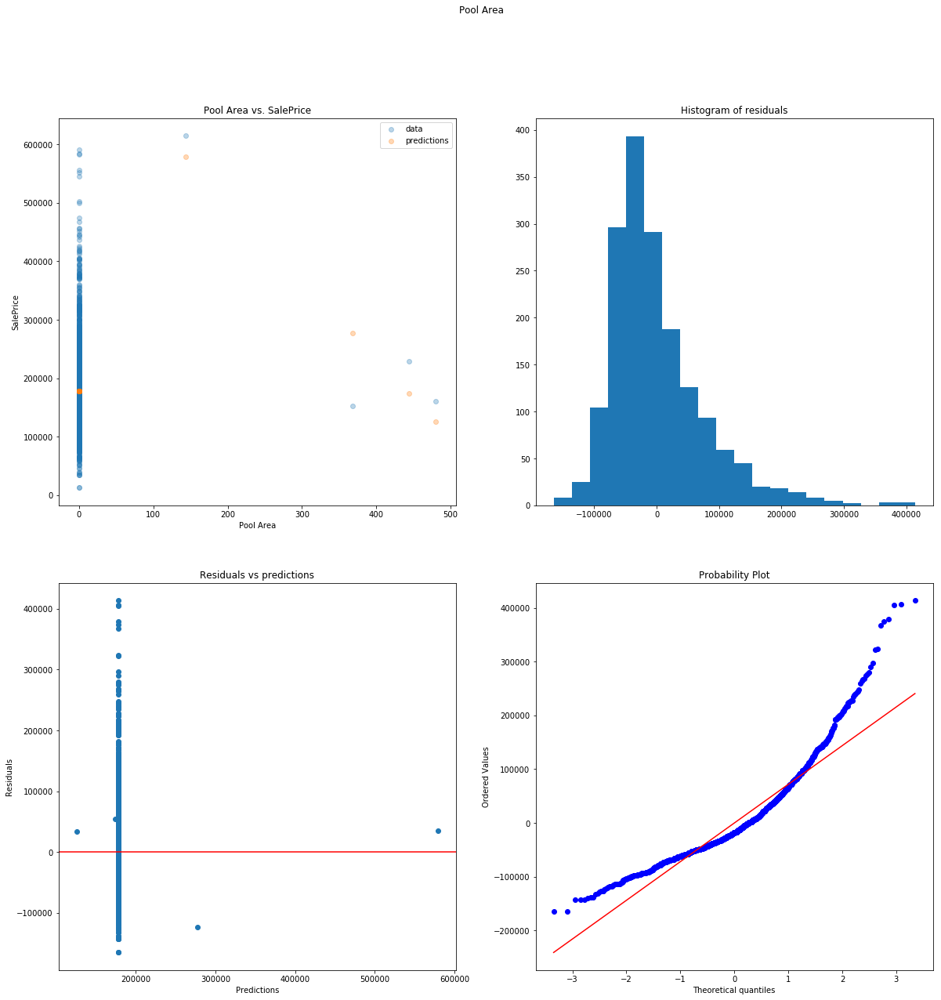

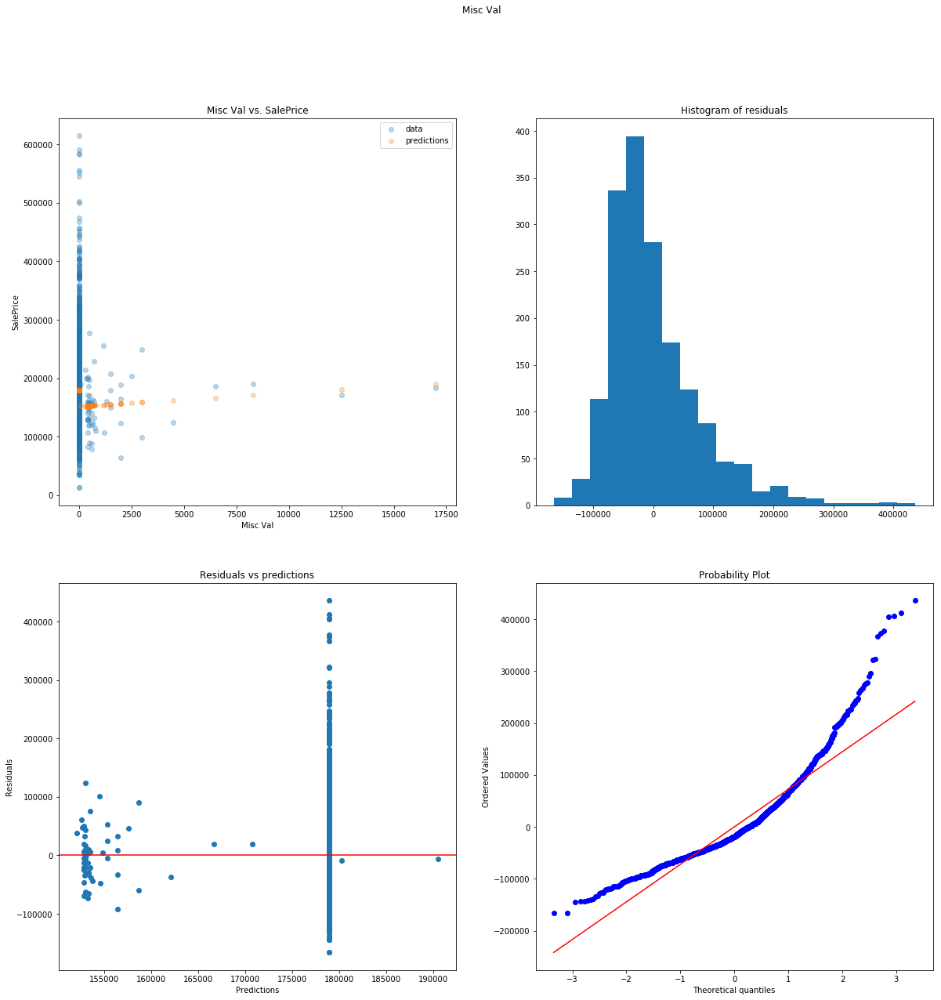

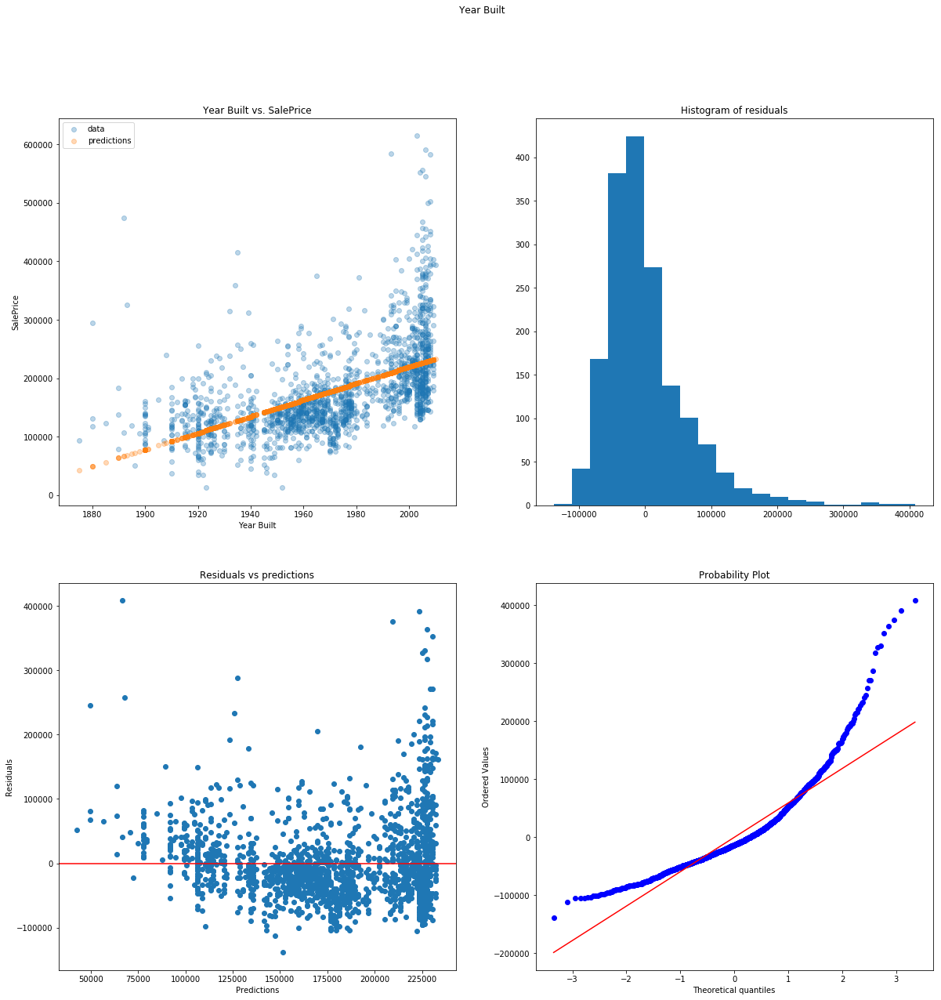

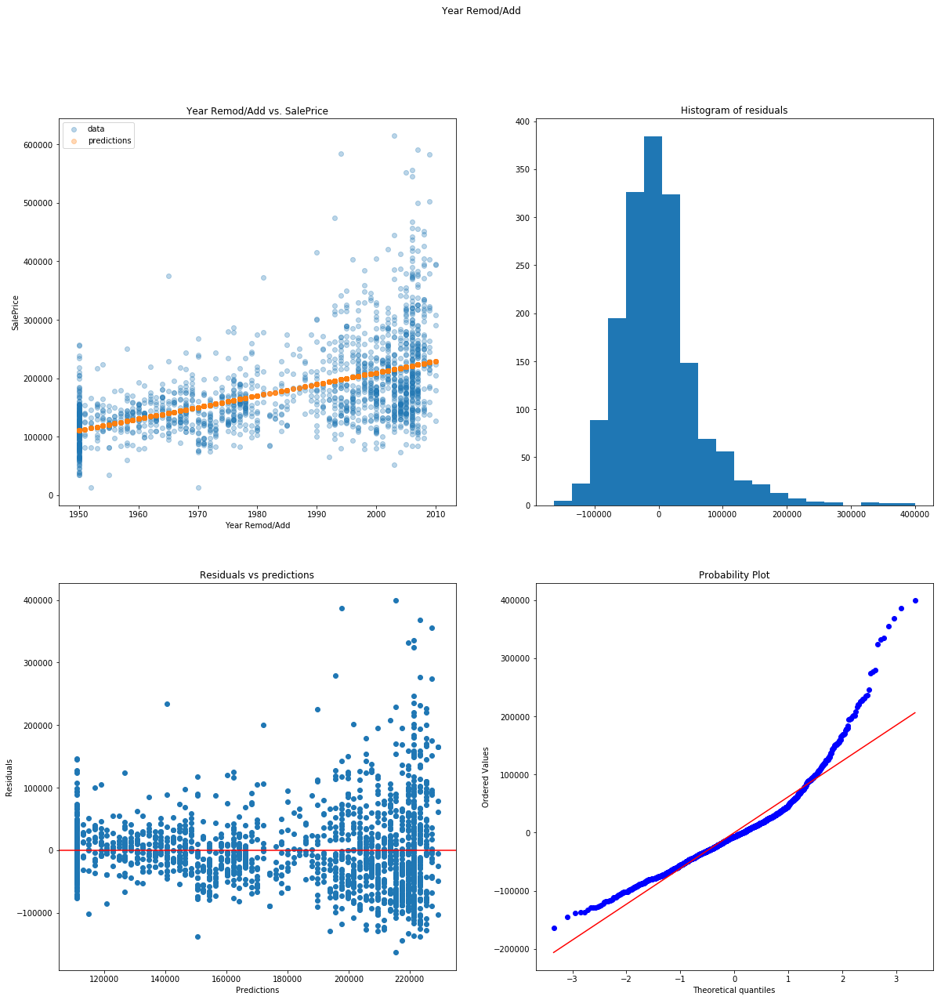

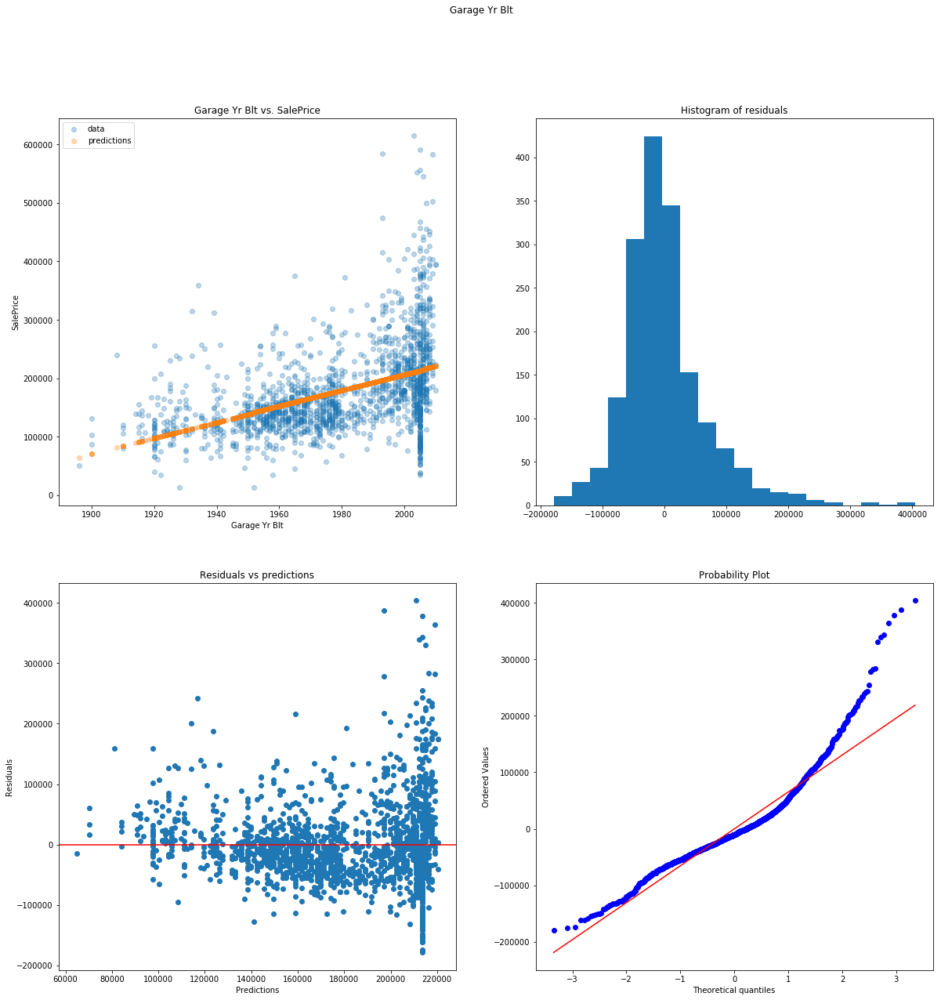

In [48]:
true_conti_var.remove("SalePrice")
with plt.rc_context(rc={'figure.max_open_warning': 0}):
    for i in true_conti_var: 
        diagplots(i, "SalePrice", house_clean_tr_noNA, degree = 1)

We can see that for all variables, the residuals are ill-behaved: none of them follow a Normal distribution, and some are clearly heteroscedastic. As established earlier, the distribution of the variables themselves, are not normal:  most of the time, they were skewed towards the right. Even though the normality of the distribution of the variables is not a necessary assumption for the linear model (only of the residuals), trying a transformation on the variables, might help achieve a better modelisation of the relationship between the independant and the target variable. 
First, we try to transform SalePrice: 

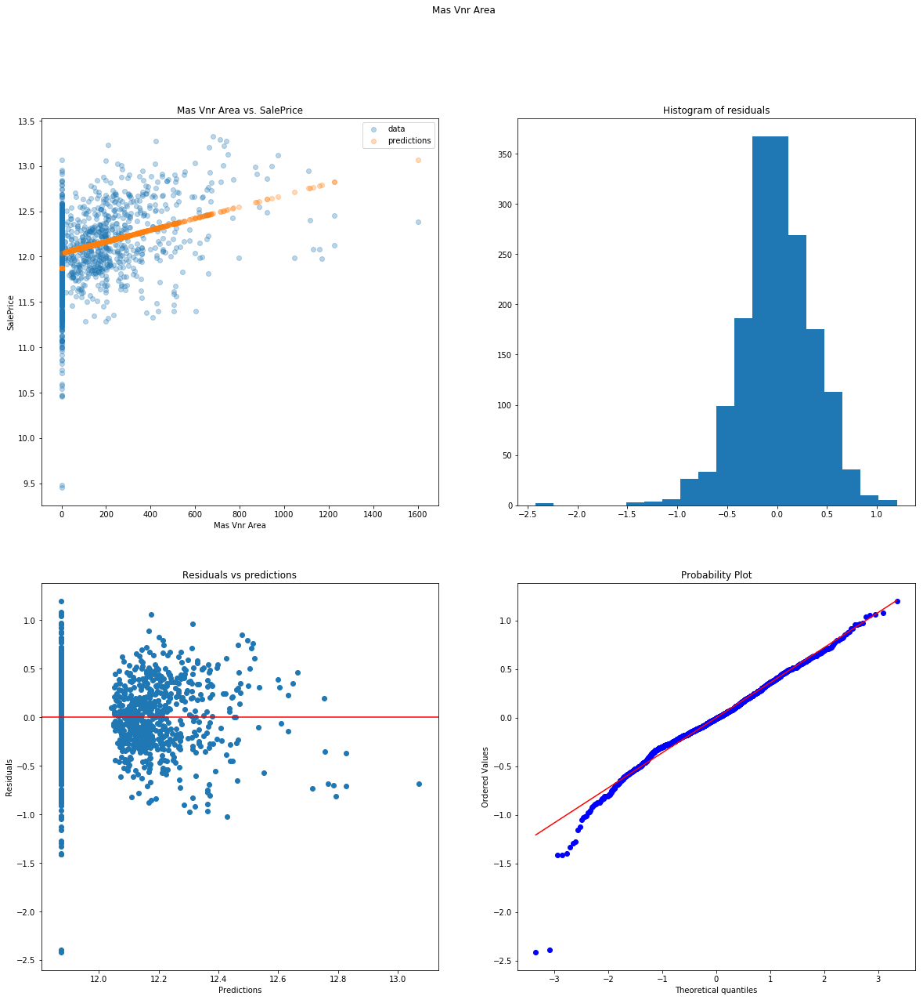

In [49]:
transfo_data = house_clean_tr_noNA.copy()
#transfo_data["Lot Frontage"] = np.log1p(transfo_data["Lot Frontage"])
transfo_data["SalePrice"] = np.log1p(transfo_data["SalePrice"])
diagplots("Mas Vnr Area", "SalePrice", transfo_data, degree = 1)

We can see that all regressions with the original variables yield ill-behaved residuals that are not normally distributed 

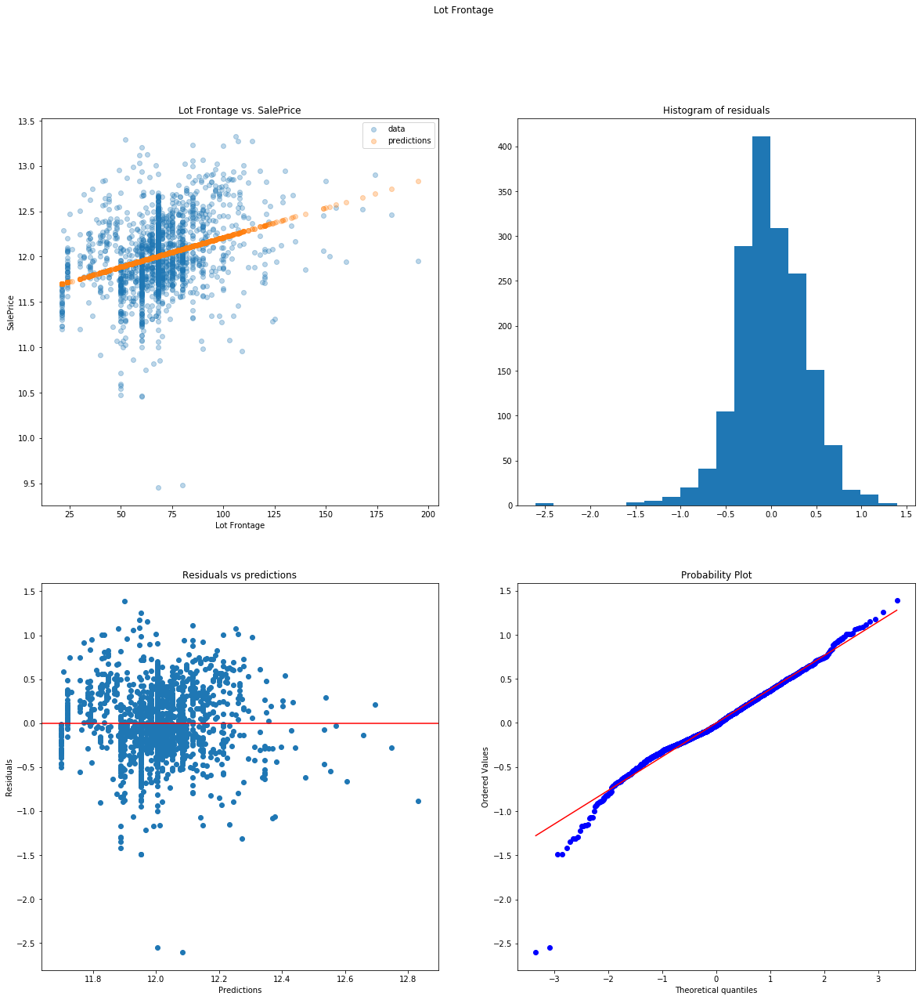

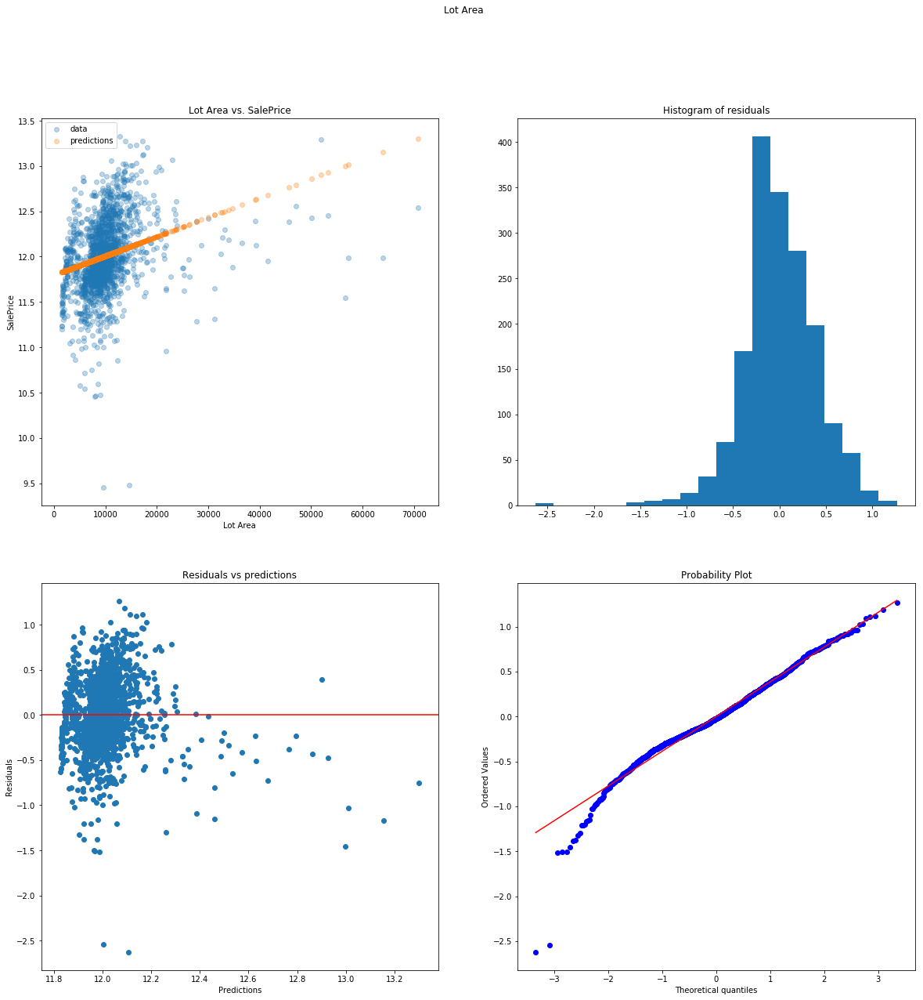

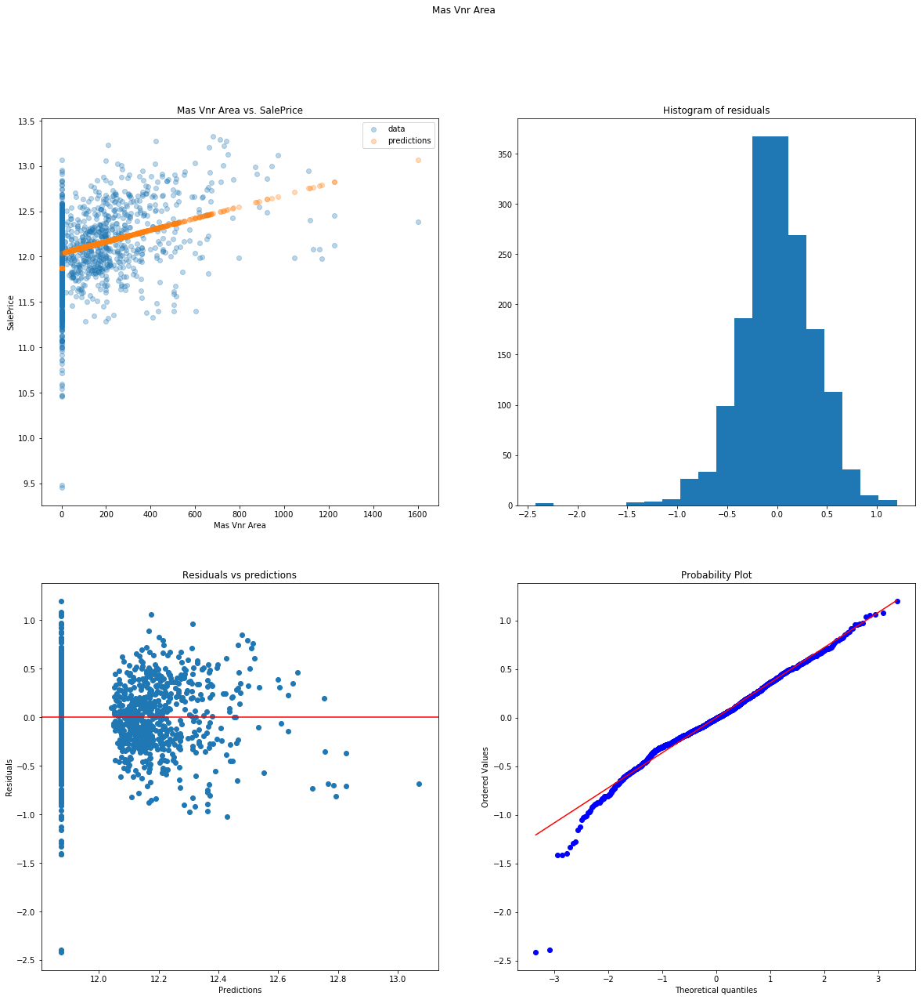

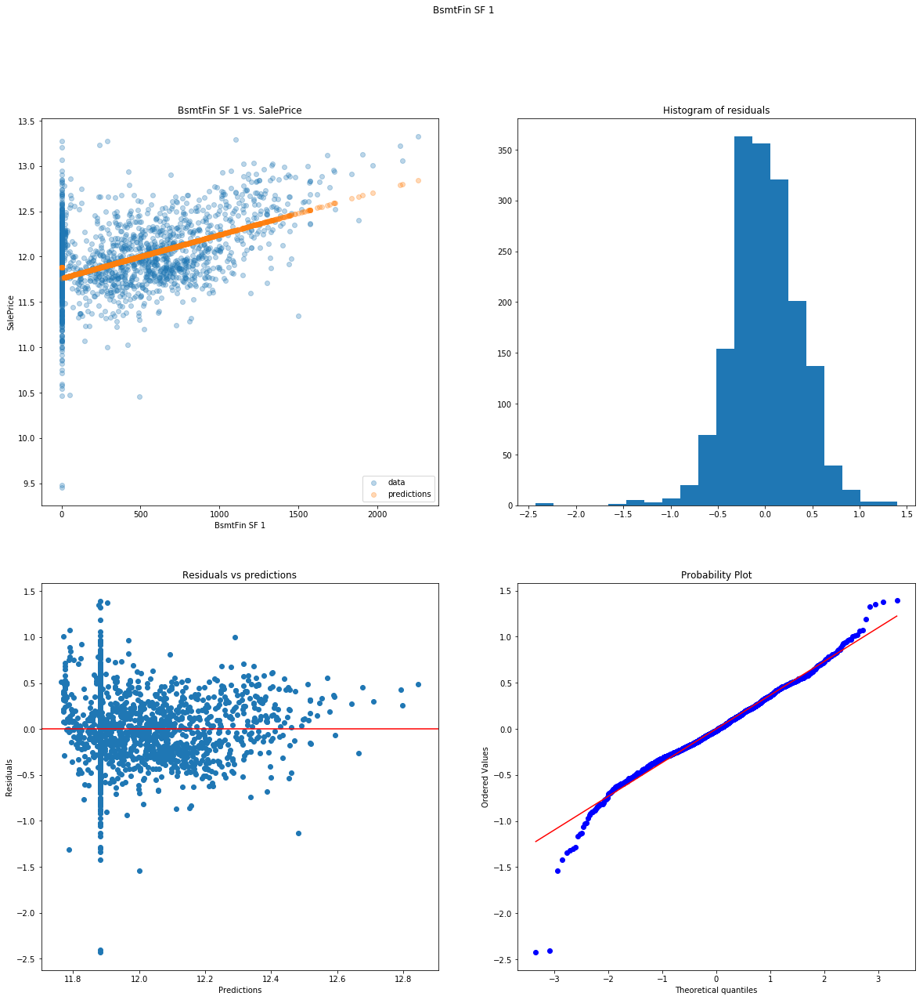

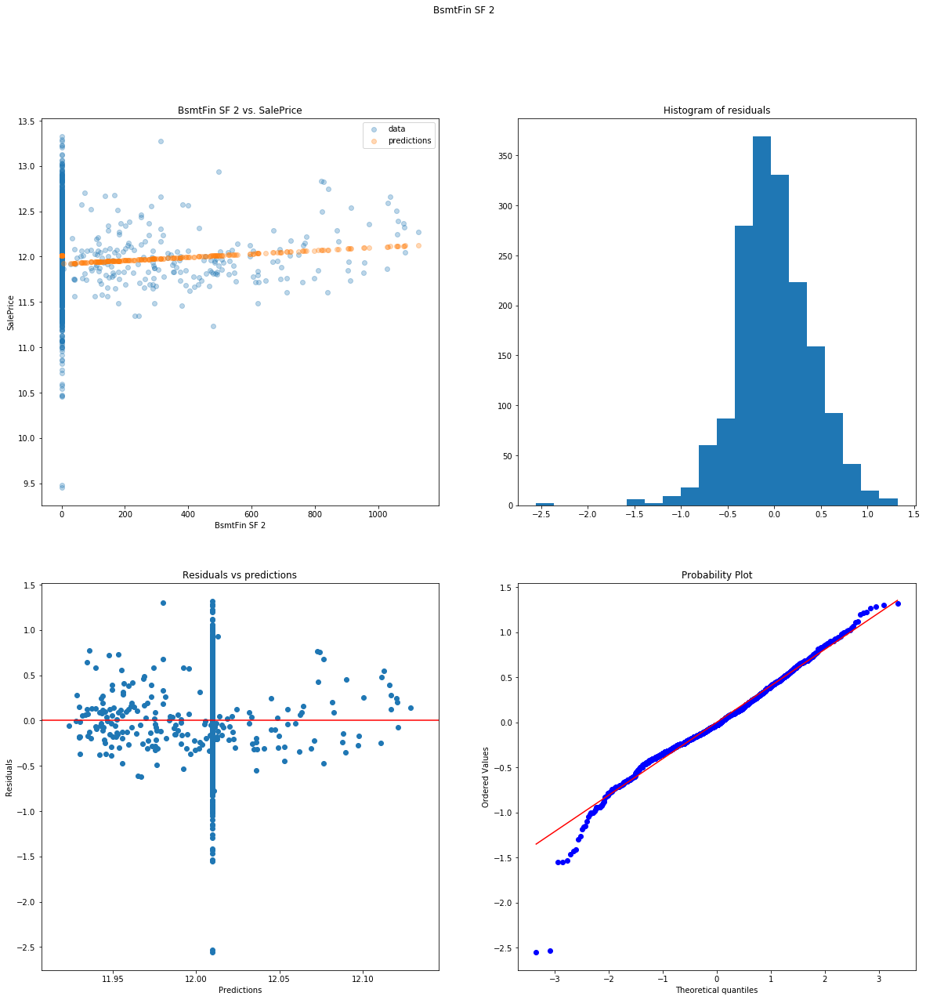

...

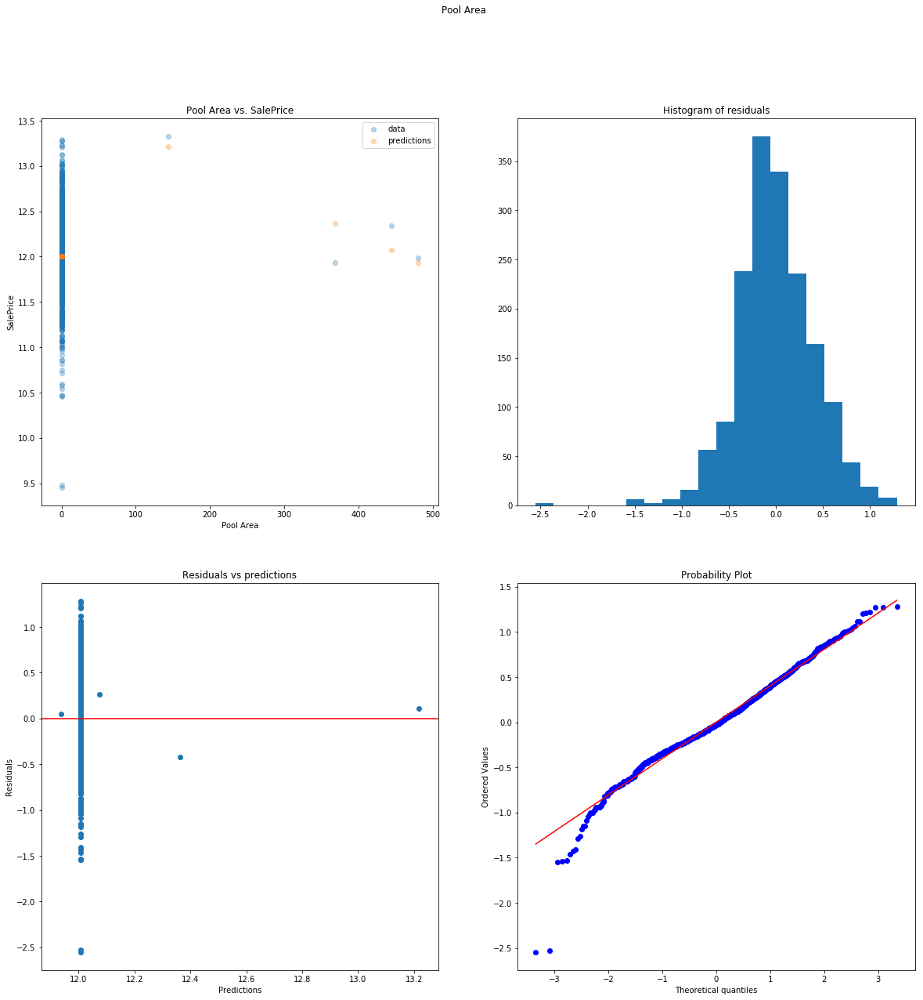

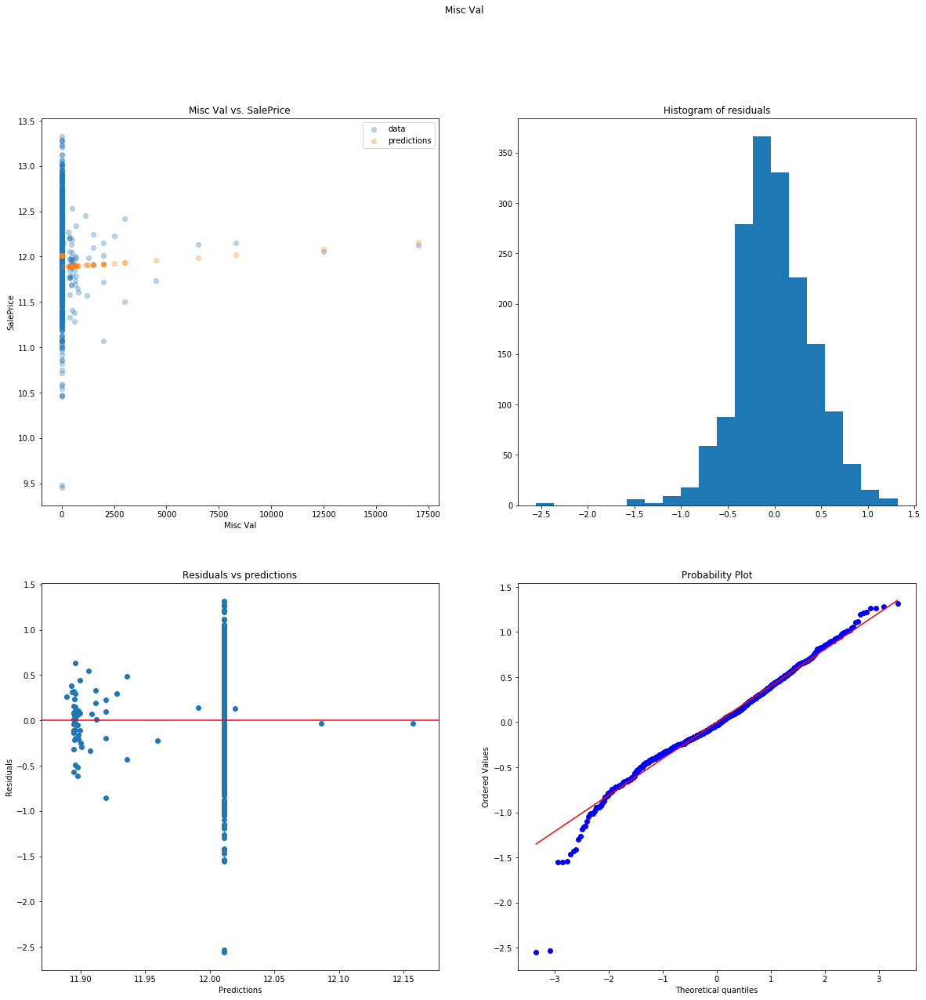

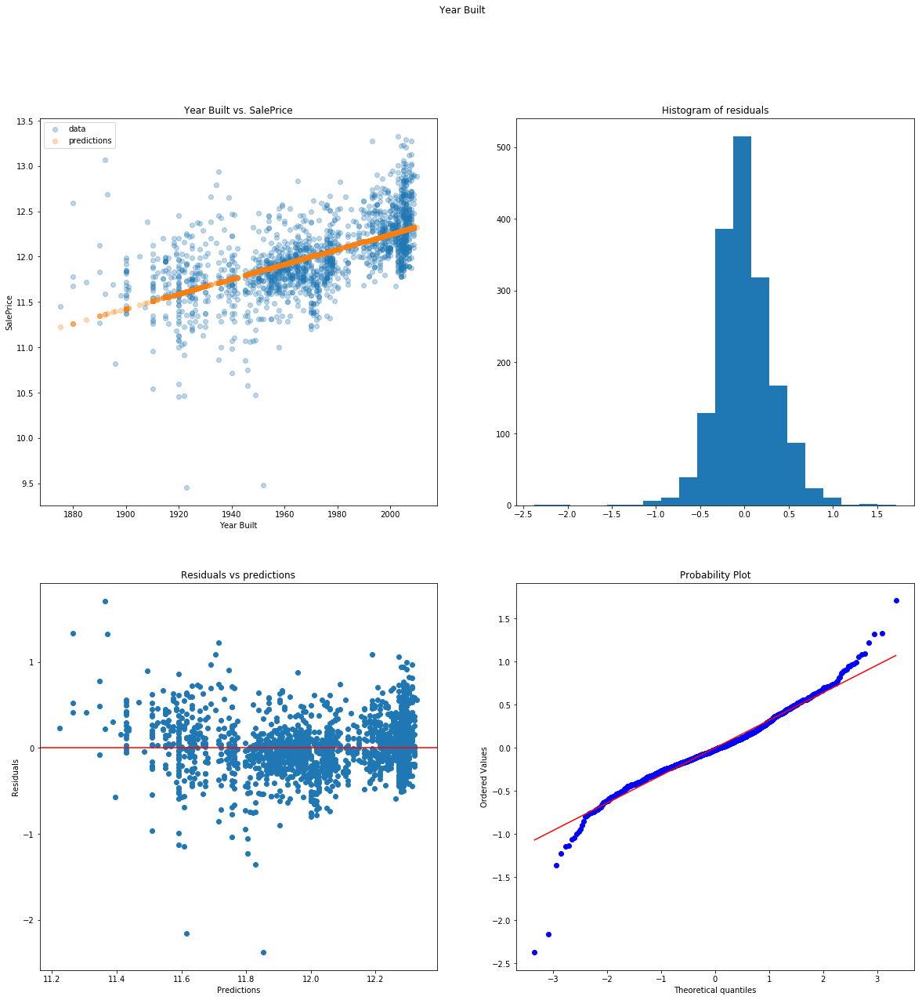

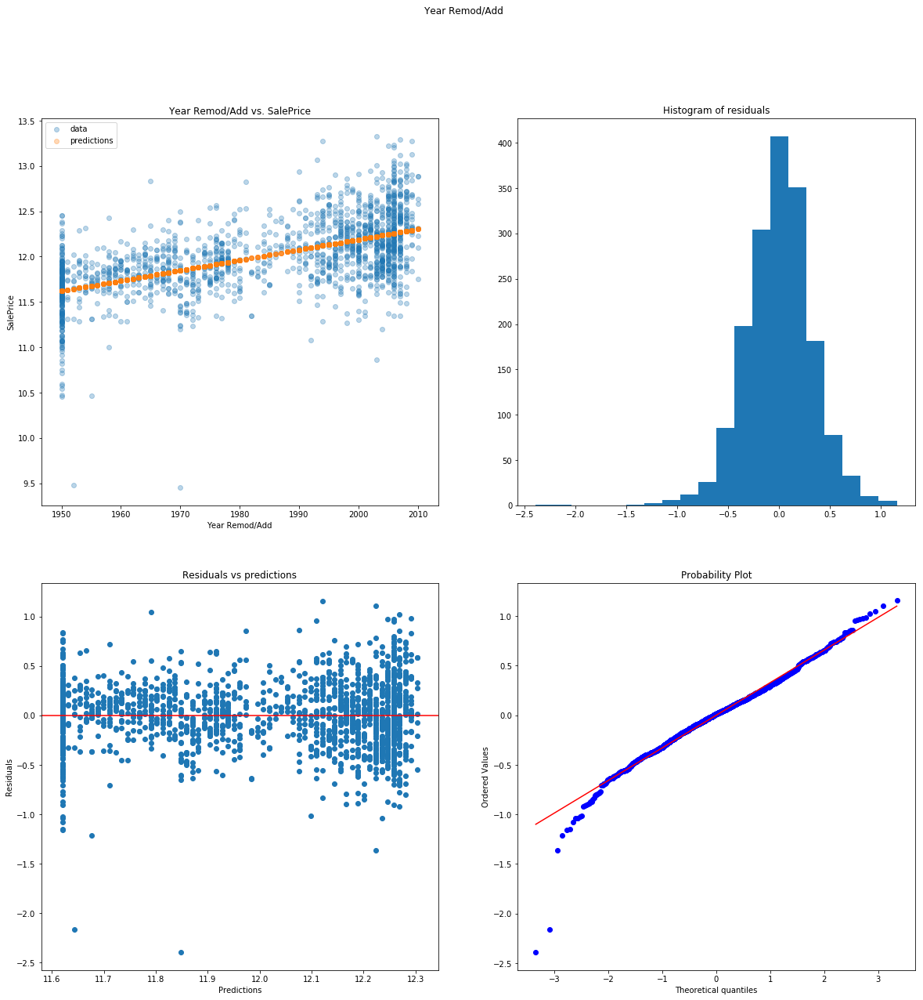

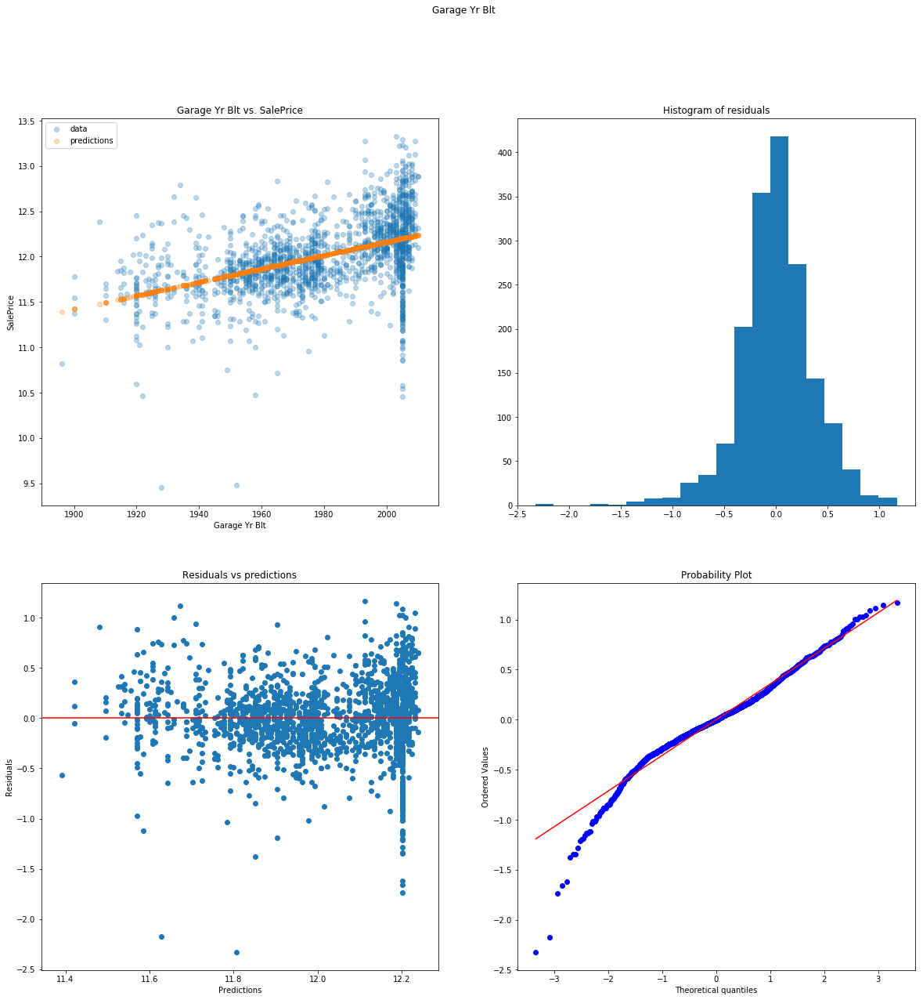

In [50]:
transfo_data = house_clean_tr_noNA.copy()
transfo_data["SalePrice"] = np.log1p(transfo_data["SalePrice"])
with plt.rc_context(rc={'figure.max_open_warning': 0}):
    for i in true_conti_var: 
        diagplots(i, "SalePrice", transfo_data, degree = 1)

After log transforming SalePrice, the residuals look much better for almost all of the continuous variables. We can see that transforming the target variable made some of the lowest price seem extreme in comparison of the other values in this variable. The 2 corresponding houses are both houses with unusually low prices that are flagged as "Abnormal" sales in the Sale Condition variable.
Even though these values are extremes, they are flagged as such and are thus not likely to be errors. We will keep them as they are in the dataset. 
This observation however leads us to think that including the Sale Condition variable in our simple and moderately complex models might be a good idea in order to predict houses with extreme sale prices more accurately. 

Most of the time, if we ignore the residuals for the two lowest prices, we can see that the homoscedasticity is pretty much respected for almost all variables. 

In addition, we can see on all qq plots that the lower residual values are generally not as aligned on the theoretical quantile line as the rest of the residuals. This is a first indication that our models will tend to have poor predictive values for houses with lower prices. 
Amongst the variables with the worst behaved residuals, we can find: 
* Garage Yr Blt (S-shape on qq plot)
* Year Add/Remod (maybe? to do: come back to it and reassess)
* Year Built (heteroscedasticity (scatter plot is banana shaped)  
* Misc Val (if we ignore the large amount of 0, the residuals don't seem very homoscedastic) 
* Enclosed Porch (kind of a decreasing linear relationship between residuals and predicted values)
* Lot Area

Let's work on each one, by one and try to apply transformations to these variables to establish if we can make them behave better. 

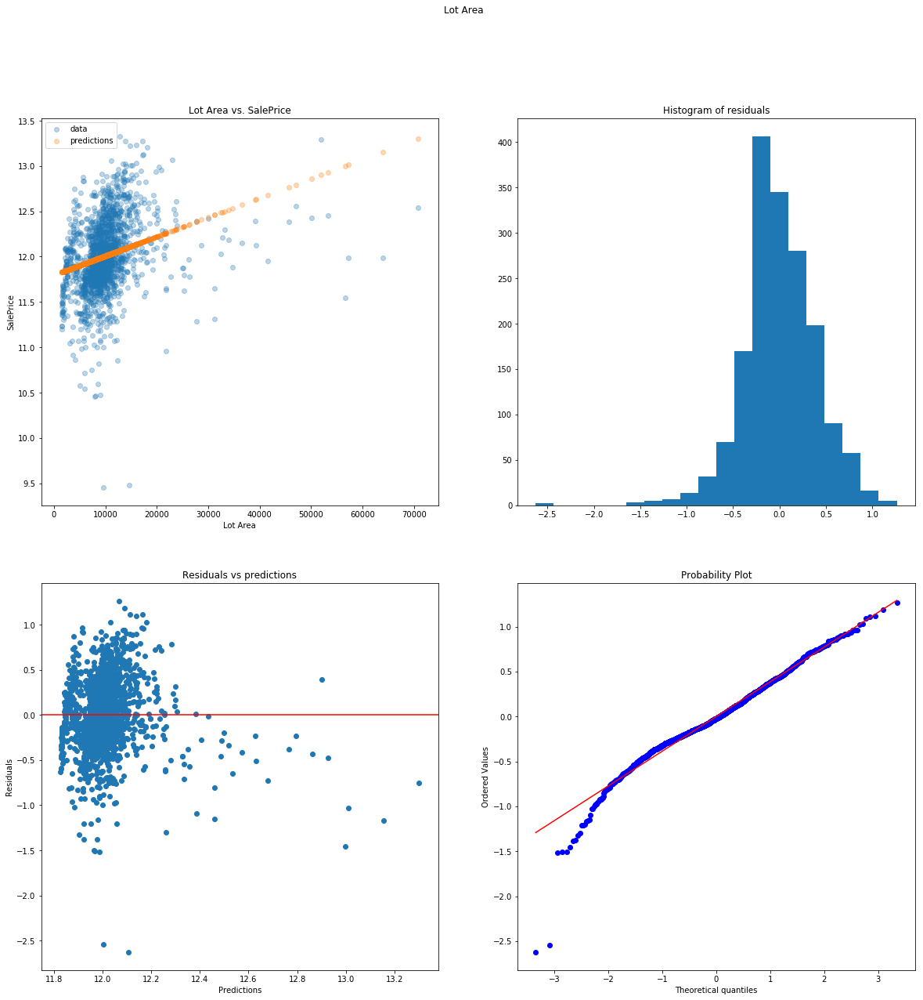

In [51]:
# Lot area
transfo_data = house_clean_tr_noNA.copy()
transfo_data["Lot Area"] = transfo_data["Lot Area"]
transfo_data["SalePrice"] = np.log1p(transfo_data["SalePrice"])
diagplots("Lot Area", "SalePrice", transfo_data, degree = 1)

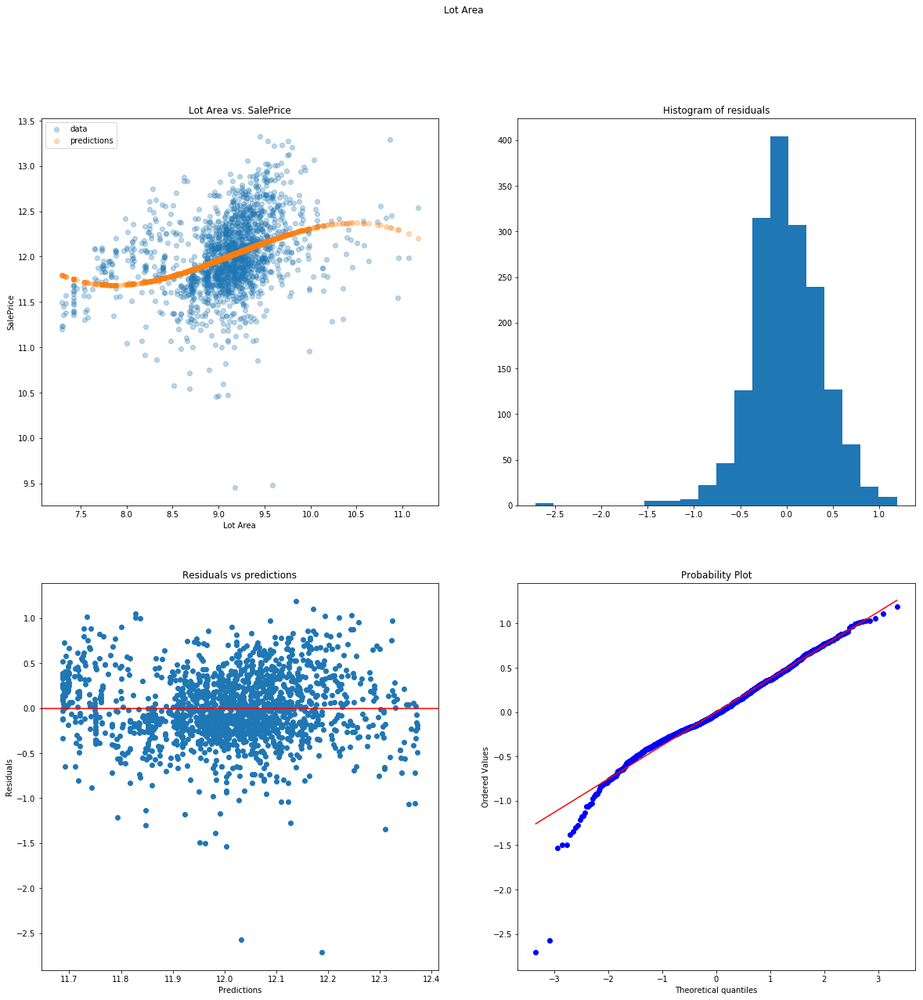

In [52]:
# Lot area
transfo_data = house_clean_tr_noNA.copy()
transfo_data["Lot Area"] = np.log1p(transfo_data["Lot Area"])
transfo_data["SalePrice"] = np.log1p(transfo_data["SalePrice"])
diagplots("Lot Area", "SalePrice", transfo_data, degree = 3)

Doing a log transformation then adjusting a polynomial function with degree 3 for Lot Area, seems to yield a better description of the relationship betwwen Lot Area and SalePrice (homoscedasticity of the residuals is kind of restored). 

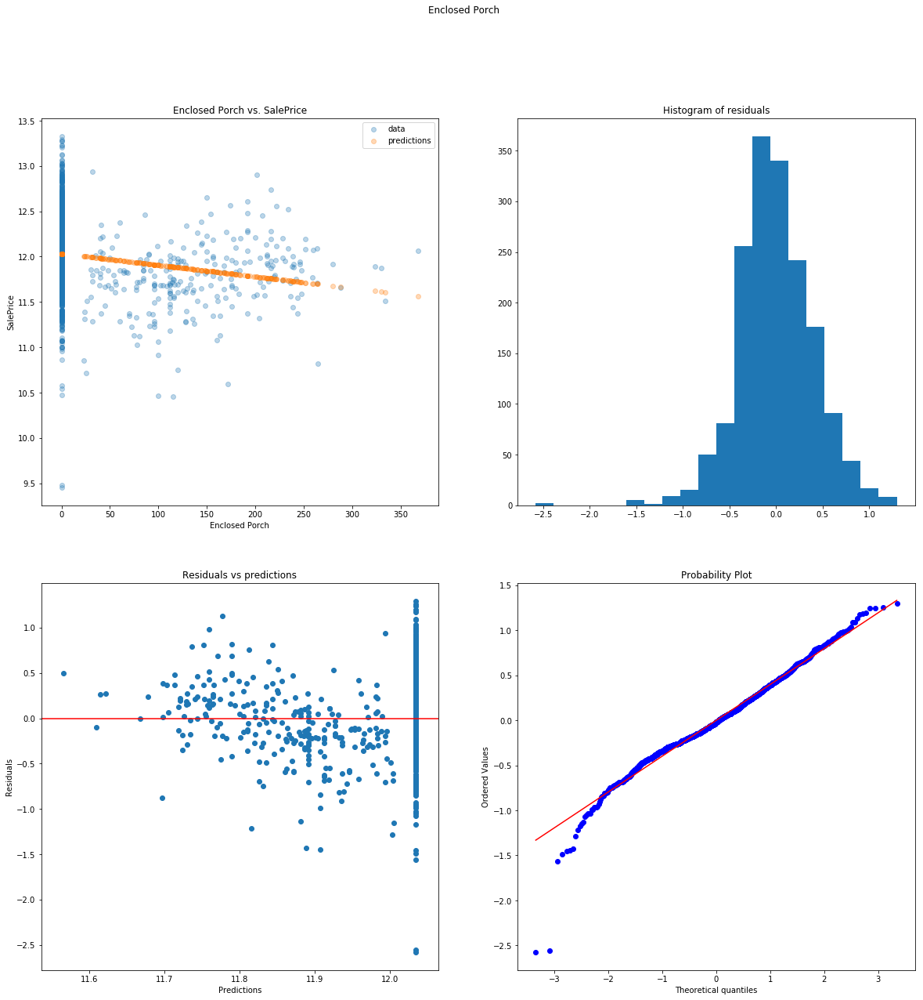

In [53]:
# Enclosed Porch
transfo_data = house_clean_tr_noNA.copy()
transfo_data["Enclosed Porch"] = transfo_data["Enclosed Porch"]
transfo_data["SalePrice"] = np.log1p(transfo_data["SalePrice"])
diagplots("Enclosed Porch", "SalePrice", transfo_data, degree = 1)

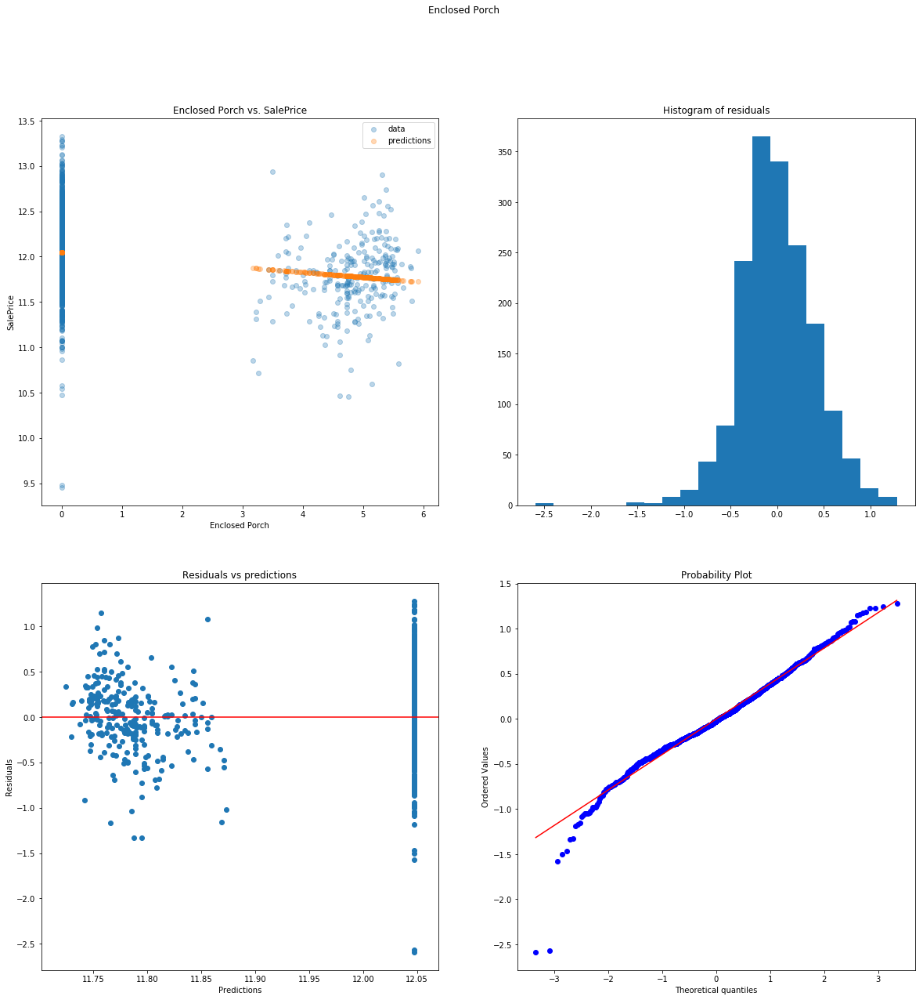

In [54]:
# Enclosed Porch
transfo_data = house_clean_tr_noNA.copy()
transfo_data["Enclosed Porch"] = np.log1p(transfo_data["Enclosed Porch"])
transfo_data["SalePrice"] = np.log1p(transfo_data["SalePrice"])
diagplots("Enclosed Porch", "SalePrice", transfo_data, degree = 1)

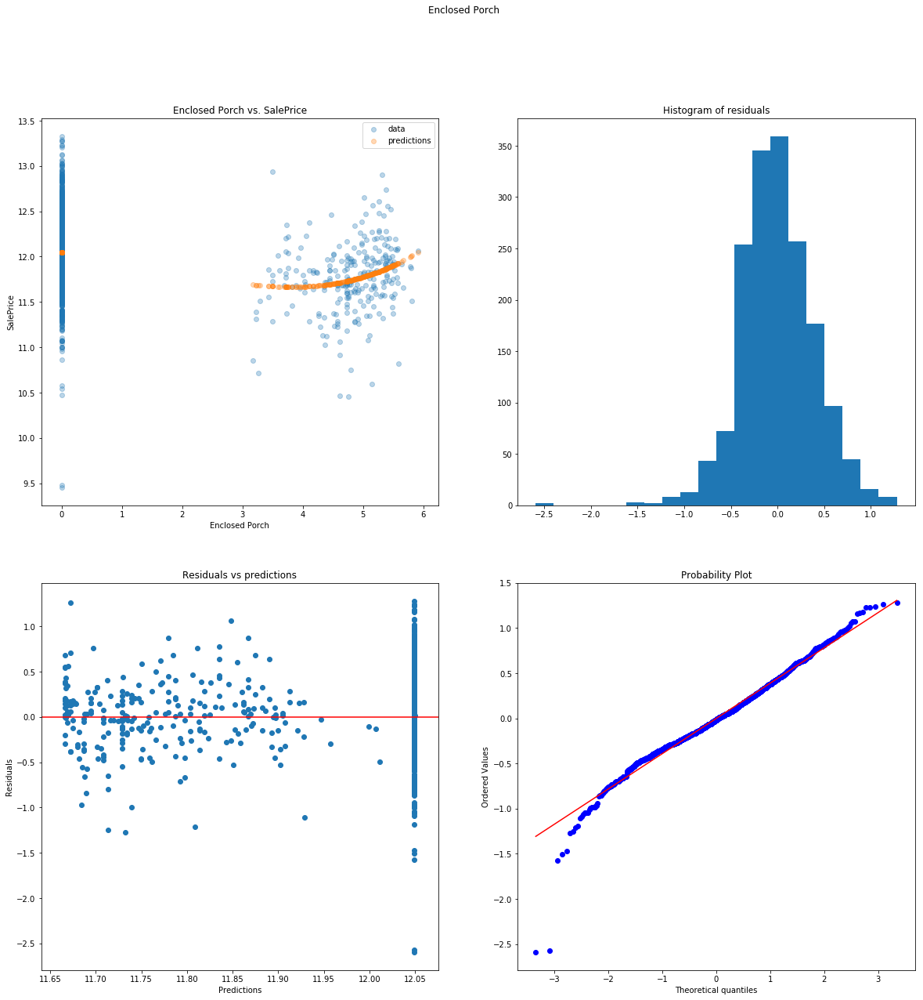

In [55]:
diagplots("Enclosed Porch", "SalePrice", transfo_data, degree = 3)

Using a polynomial function with Enclosed Porch seem to better describe the relationship between this variable and SalePrice (homoscedasticity of the residuals is restored) than log transforming the variable. However, it is to note that even though this seem to modelize better the relationship, it makes it difficult to interpret the relationship between the two variables (the same goes for Lot Area).  

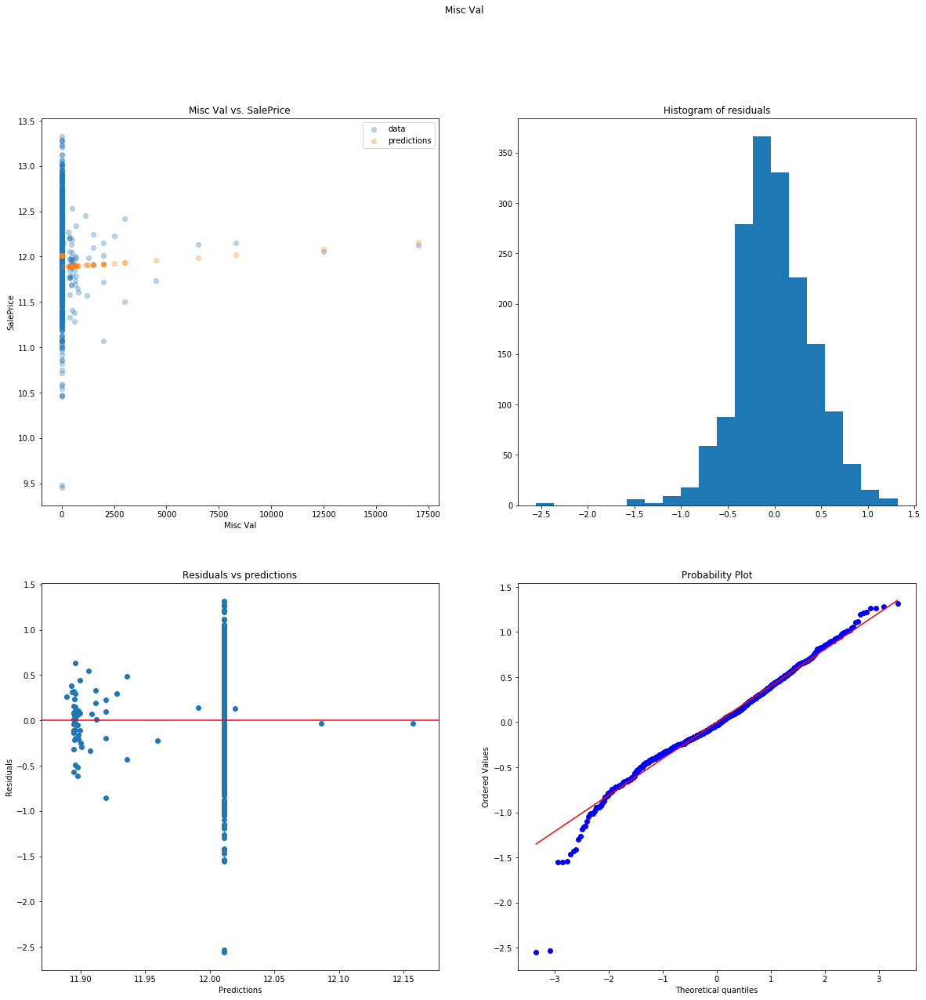

In [56]:
# Misc Val
transfo_data = house_clean_tr_noNA.copy()
transfo_data["Misc Val"] = transfo_data["Misc Val"]
transfo_data["SalePrice"] = np.log1p(transfo_data["SalePrice"])
diagplots("Misc Val", "SalePrice", transfo_data, degree = 1)

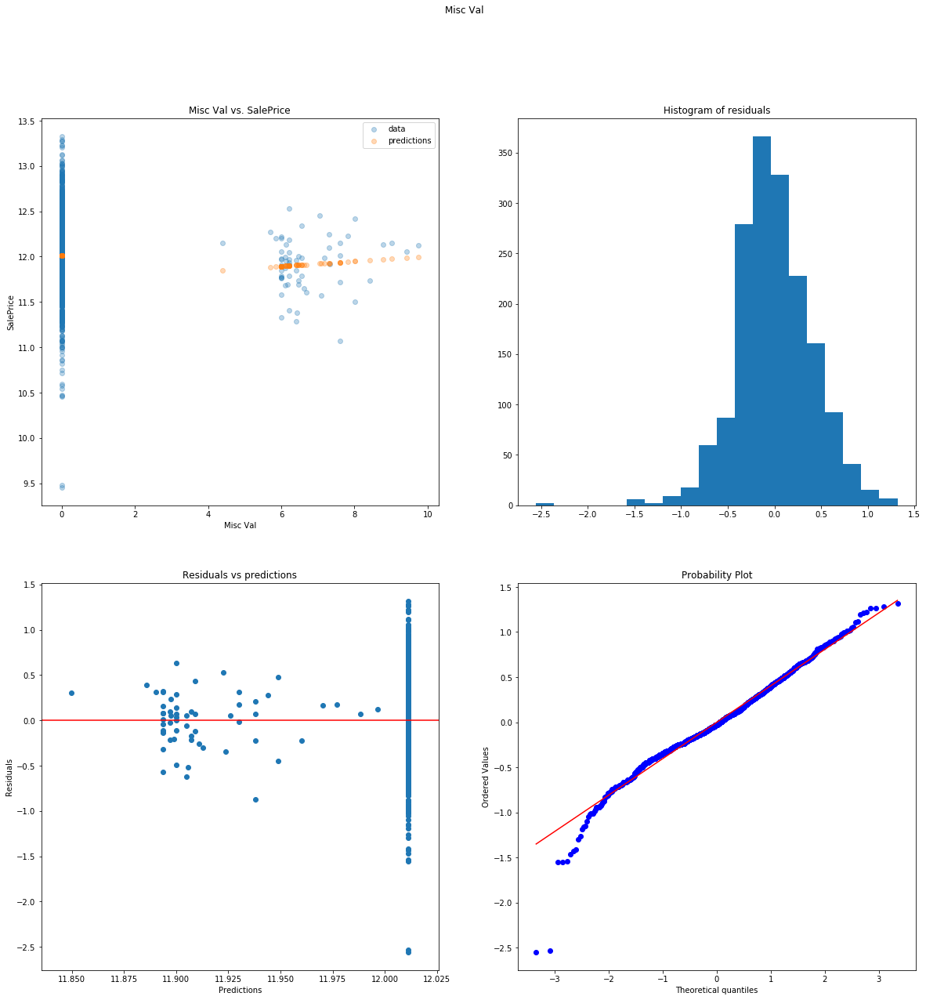

In [57]:
# Misc Val
transfo_data = house_clean_tr_noNA.copy()
transfo_data["Misc Val"] = np.log1p(transfo_data["Misc Val"])
transfo_data["SalePrice"] = np.log1p(transfo_data["SalePrice"])
diagplots("Misc Val", "SalePrice", transfo_data, degree = 1)

Log-transforming Misc Val allows the residuals to show a better behaviour (better homoscedasticity). Adding a polynome to the model doesn't seem necessary as the relationship between the two log-transformed variables seem linear. 

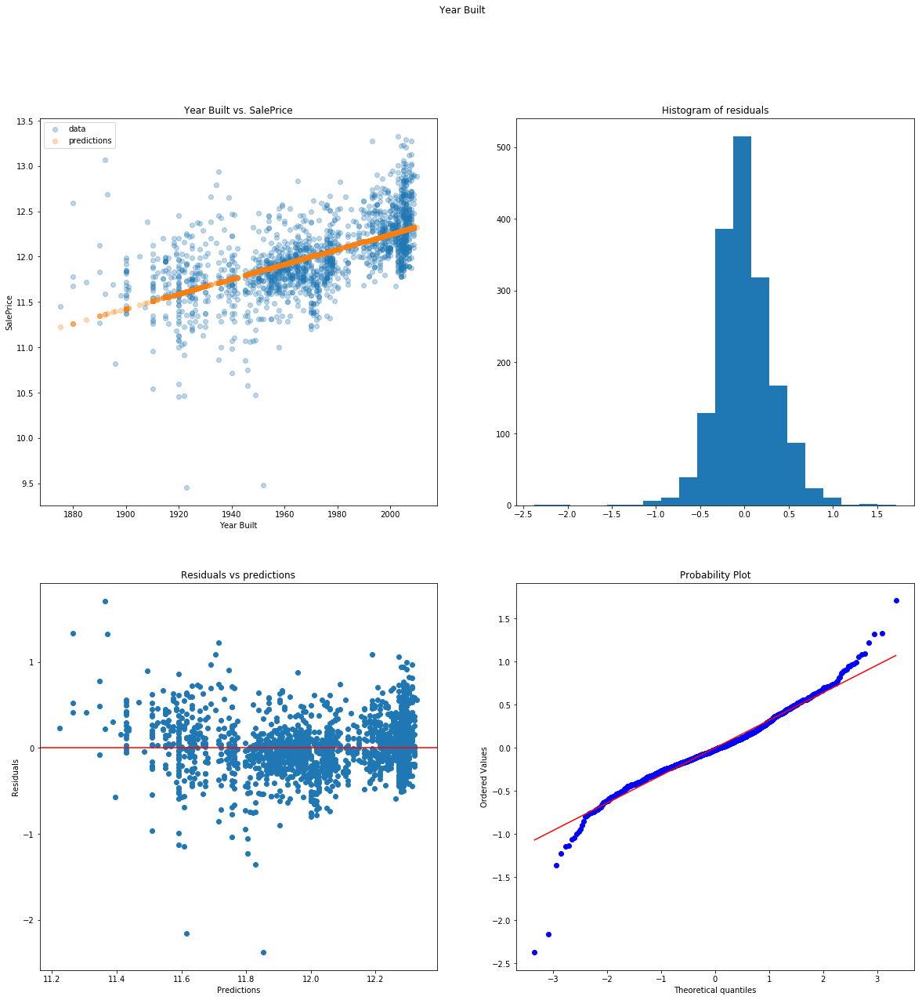

In [58]:
diagplots("Year Built", "SalePrice", transfo_data, degree = 1)

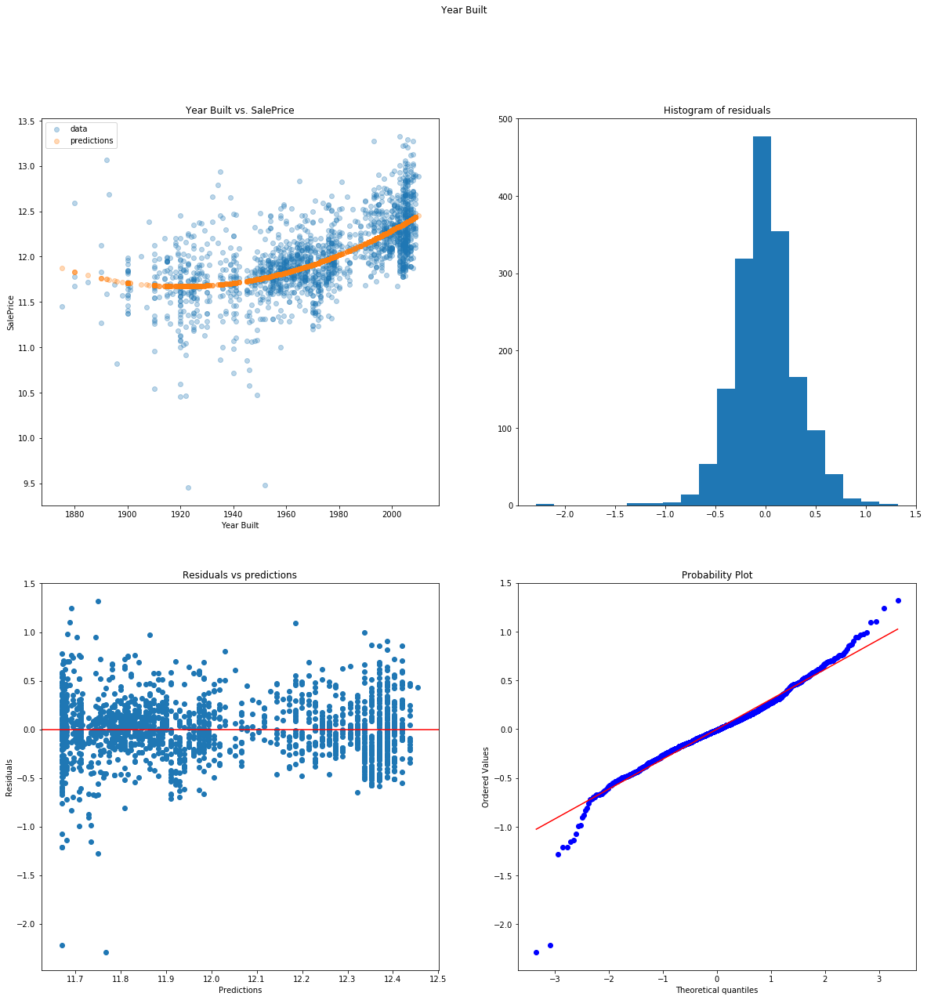

In [59]:
diagplots("Year Built", "SalePrice", transfo_data, degree = 2)

Using a polynomial function of degree 2 to model the relationship between Year Built and SalePrice helps with homoscedasticity of the residuals. 

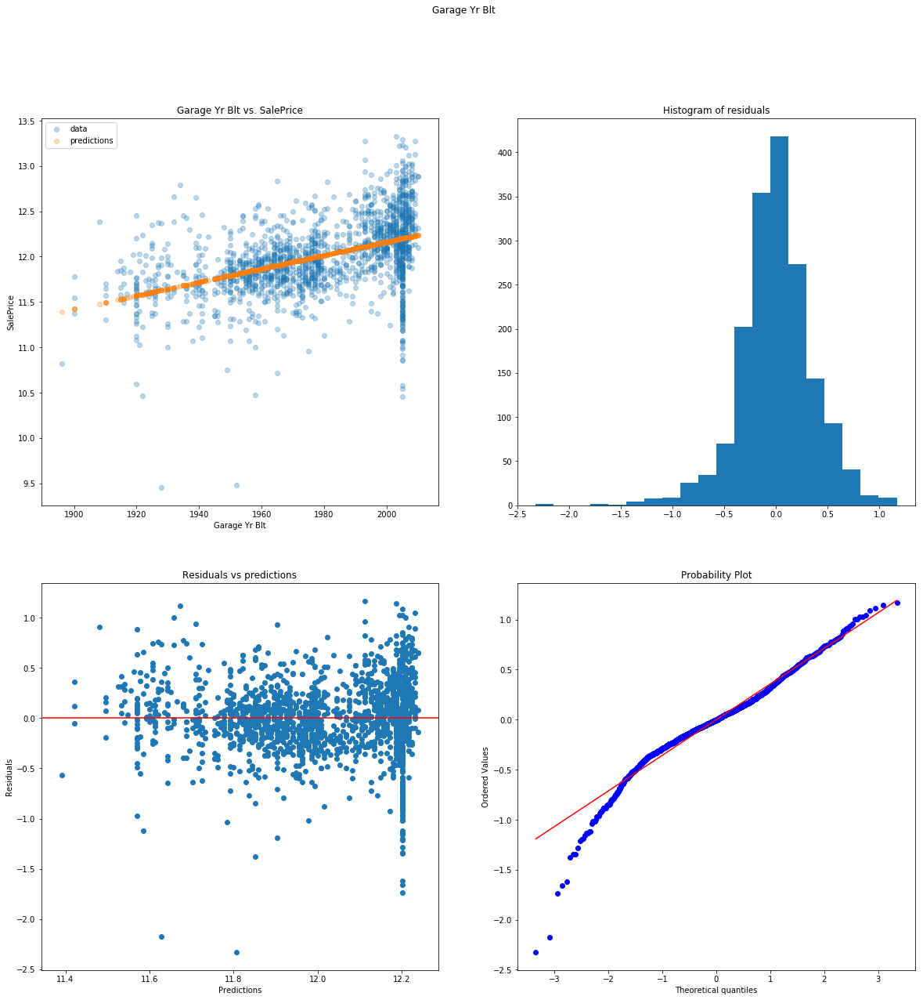

In [60]:
diagplots("Garage Yr Blt", "SalePrice", transfo_data, degree = 1)

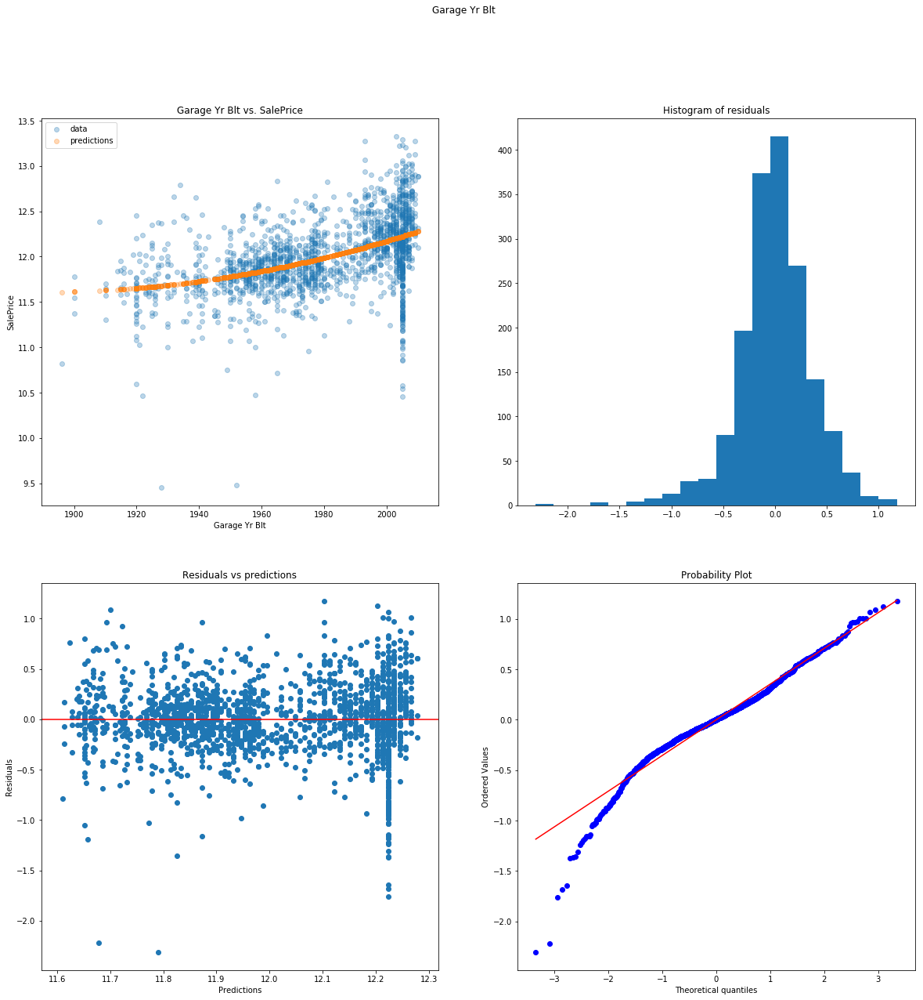

In [61]:
diagplots("Garage Yr Blt", "SalePrice", transfo_data, degree = 2)

Using a polynomial function of degree 2 to model the relationship between Garage Yr Blt and SalePrice helps with homoscedasticity of the residuals. 

In summary, after studying the relationship between the continuous independent variables and the target variable SalePrice, we decided to apply the following transformations: 
1. log-transform SalePrice
2. log-transform Lot Area and add a polynomial function of degree 3
3. use a polynomial function of degree 3 with Enclosed Porch
4. log-transform Misc Val
5. use a polynomial function of degree 2 with Year Built 
6. use a polynomial function of degree 2 with Garage Yr Blt

In addition, the continuous variables that are the most promising to explain SalePrice, based on the strength of the relationship and the adequation of the residuals to the linear regressions assumptions: 
* Lot Frontage
* Total Bsmt SF
* Gr Liv Area
* Garage Area
* Year built


Now that we have explored the relationship between the continuous variables, we will focus on the discrete variables. 
##### Exploratory Analysis of Discrete variables

In [62]:
# Box plots of SalePrice vs. the discrete variables 
disc_var.remove('Year Built')
disc_var.remove('Year Remod/Add')
disc_var.remove('Garage Yr Blt')



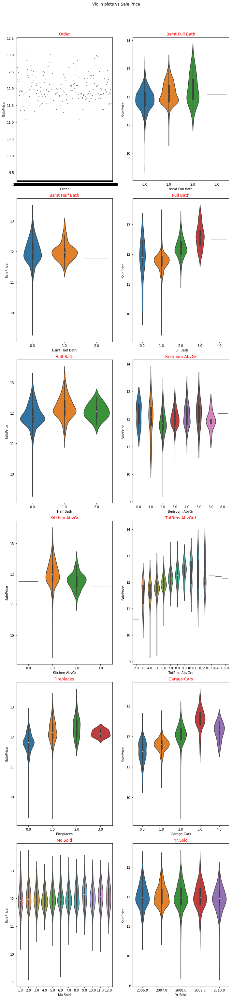

In [63]:
fig=plt.figure(figsize=(10,50))
for i, feature in enumerate(disc_var):
    ax=fig.add_subplot(1+(len(disc_var)/2),2,i+1)
    sns.violinplot(transfo_data[feature], transfo_data["SalePrice"])    
    ax.set_title(feature,color='red')

fig.tight_layout()  
plt.suptitle("Violin plots vs Sale Price")
plt.subplots_adjust(top=0.95)
plt.show()

First, we can see that there doesn't seem to be linked to Order, which is a good thing. We can also see that the prices don't seem to be correlated with the year or the months sold as the distribution of the prices seem to be equivalent for each month and each year. 
Among the most interesting discrete variables, we can note: 
* Full Bath: the more full bathrooms in the house, the higher SalePrice
* Fireplaces, Garage Cars and TotRms AbvGrd: the more of these elements are in these houses, the higher the prices, until a certain value, where the price decreases when these variables increase. 

We now focus on the ordinal variables. 

#### Exploratory analysis of Ordinal Variables: 
Our first step for ordinal variables, will be to recode them so that the order of the categories is clear. To this end, we will replace the ordinal categories with numbers going on a scale from 1 to the max number of categories, with 1 being the worst category, and the maximum category for the best category. Additionally, the No_XXX category when it exists will be coded with 0. 

For example, for Heatibg QC, we will have: 
Ex	Excellent:	5
Gd	Good:	4 
TA	Average/Typical:	3
Fa	Fair:	2
Po	Poor:	1
NA	No Pool:	0

In [64]:
ordi_var

['Lot Shape',
 'Utilities',
 'Land Slope',
 'Overall Qual',
 'Overall Cond',
 'Exter Qual',
 'Exter Cond',
 'Bsmt Qual',
 'Bsmt Cond',
 'Bsmt Exposure',
 'BsmtFin Type 1',
 'BsmtFin Type 2',
 'Heating QC',
 'Electrical',
 'Kitchen Qual',
 'Functional',
 'Fireplace Qu',
 'Garage Finish',
 'Garage Qual',
 'Garage Cond',
 'Paved Drive',
 'Pool QC',
 'Fence']

In [65]:
lst_dict_ordval = [{'Ex': '5','Gd': '4', 'TA': '3', 'Fa': '2', 'Po': '1'},
                   {'GLQ': '6','ALQ': '5', 'BLQ': '4', 'Rec': '3', 'LwQ': '2', 'Unf': '1'},
                   {'Reg': '1','IR1': '2','IR2': '3','IR3': '4'},
                   {'AllPub': '4', 'NoSewr': '3', 'NoSeWa': '2', 'ELO': '1'},
                   {'Gtl': '3', 'Mod': '2', 'Sev': '1'},
                   {'Gd': '4','Av': '3', 'Mn': '2', 'No': '1'},
                   {'SBrkr': '5','FuseA': '4', 'FuseF': '3', 'FuseP': '2', 'Mix': '1'},
                   {'Typ': '8', 'Min1': '7', 'Min2': '6', 'Mod': '5', 'Maj1': '4', 'Maj2': '3', 'Sev': '2', 'Sal': '1'}, 
                   {'Fin': '3', 'RFn': '2', 'Unf': '1'},
                   {'Y': '3', 'P': '2', 'N': '1'},
                   {'GdPrv': '4', 'MnPrv': '3', 'GdWo': '2', 'MnWw': '1'}
                  ]

lst_grp_ordval = [['Exter Qual', 'Exter Cond', 'Bsmt Qual', 'Bsmt Cond', 'Heating QC', 
                'Kitchen Qual', 'Fireplace Qu', 'Garage Qual', 
                'Garage Cond', 'Pool QC'], 
                  ['BsmtFin Type 1', 'BsmtFin Type 2'],
                  ['Lot Shape'], 
                  ['Utilities'], 
                  ['Land Slope'], 
                  ['Bsmt Exposure'], 
                  ['Electrical'], 
                  ['Functional'], 
                  ['Garage Finish'], 
                  ['Paved Drive'], 
                  ['Fence']]

In [66]:
def recode_ordi(df, lst_var, d): 
    df_copy= df.copy()
    for vas, recode_d in zip(lst_var, d): 
        for va in vas: 
            df_copy[va] = df_copy[va].replace(to_replace = recode_d, value = None)
    # replace No_XXXX with 0: 
    unest_lst_var = [item for sublist in lst_var for item in sublist]
    df_copy[unest_lst_var] = df_copy[unest_lst_var].replace(to_replace = r'^No_.+$', value = '0', regex = True)
    return df_copy
test_df = recode_ordi(transfo_data, lst_grp_ordval,lst_dict_ordval)

In [67]:
test_df['Fence'].value_counts()

0    1351
3     211
4      73
2      59
1       7
Name: Fence, dtype: int64

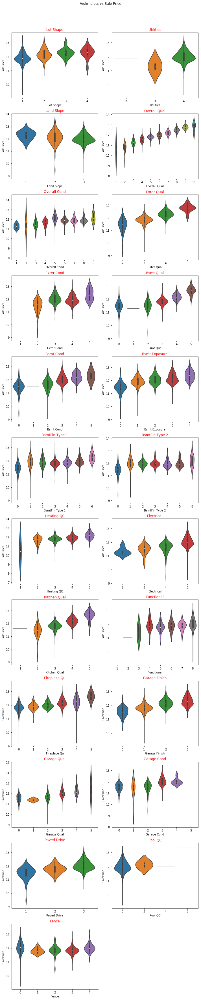

In [68]:
fig=plt.figure(figsize=(10,50))
for i, feature in enumerate(ordi_var):
    ax=fig.add_subplot(1+(len(ordi_var)/2),2,i+1)
    sns.violinplot(test_df[feature].astype(int), test_df["SalePrice"])    
    ax.set_title(feature,color='red')

fig.tight_layout()  
plt.suptitle("Violin plots vs Sale Price")
plt.subplots_adjust(top=0.95)
plt.show()

Overall, it seems that the ordinal value that seems to have the most importance to explain the price is Overall Quality, where the higher the quality, the higher the price.
Similarly, over variables seem to have a positive linear relationship with SalePrice, though, less strong than Overall Quality: 
* Garage Qual / Cond / Finish
* Fireplace Qual
* Bsmt Qual / Cond
* Exter Qual 
* Heating QC
* Lot Shape 

Finally, we will focus on the nominal variables: 

##### Exploratory analysis of the nominal variables: 


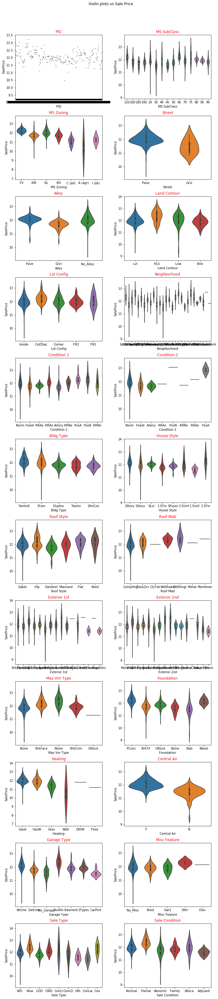

In [69]:
fig=plt.figure(figsize=(10,50))
for i, feature in enumerate(nomi_var):
    ax=fig.add_subplot(1+(len(nomi_var)/2),2,i+1)
    sns.violinplot(test_df[feature], test_df["SalePrice"])    
    ax.set_title(feature,color='red')

fig.tight_layout()  
plt.suptitle("Violin plots vs Sale Price")
plt.subplots_adjust(top=0.95)
plt.show()

Regarding the nominal variable, it is difficult to highlight any variable where there is a clear cut in prices according to categories. 
Sale Type, Sale Condition, Garage Type, Heating, Central Air,Neighbourhood, Street and MS Zoning, are all variables where the median are quite different between categories, however, the distribution of the prices between categories overlap each other, and the differences might not be significant once we build the model. 

Among them, we will particularly focus on Sale Condition, for reasons expressed earlier, as well as potentially on Central Air and MS Zoning, as they both seem to have categories with not as much overlap between their price distributions.  

#### Correlation matrix

Finally, in order to filter further the variables that we will consider for the simple model and the model of moderate complexity, and aim to avoid ill-conditioning, we will compute the correlation matrix of all quantitative variables (including discrete variables), to identify the ones that might be correlated and: 
1. identify more formally, the variables correlated with SalePrice to considere more thoroughly within the ones highlighted earlier, 
2. identify the ones that should not be included together because they are correlated. 

As we have established earlier that most of these variables are not normally distributed, we will use the non-parametric spearman correlation instead of the pearson correlation. 


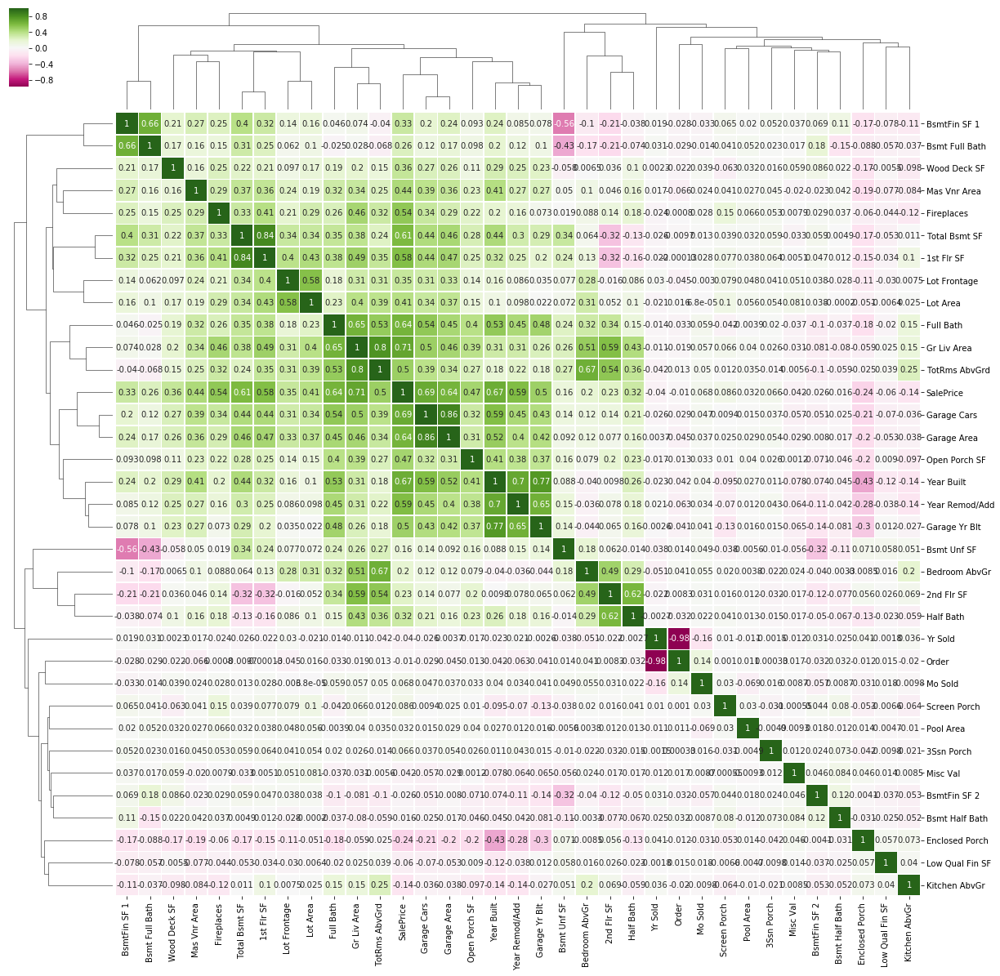

In [70]:
# Correlation: 
corr = house_clean_tr_noNA.corr(method = "spearman")


#sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), 
#            cmap=sns.diverging_palette(220, 10, as_cmap=True), square=True, ax=ax);

sns.clustermap(corr, cmap="PiYG", annot = True,
               linewidths=.75, figsize=(20, 20));

#plt.suptitle('Figure 19: Correlation matrix (spearman coefficient)', y=0.95, size=16);

* Correlation with SalePrice *
First, we focus on variables correlated with our target variable. 
We can see that the variables with the highest correlations with SalePrice, all have a positive correlation with it. Among them, the strongest correlations are with: 
* Gr Liv Area (0.71)
* Garage Cars (0.69)
* Year Built (0.67)
* Garage areas (0.64)
* Total Bsmt SF (0.61)
* Year Remod/Add (0.59)
* 1st Flr SF (0.58) 

Among them, some of these variables are actually highly correlated together. 
For example: 
* Garage Cars and Garage Area, which makes sense as a garage with more space can fit more cars. Including both of these variables would be redundant. 
* Gr Liv Area and 1st Flr SF, for the wame reason as above. 
* Year Built and Year Remod/Add. We can suppose that houses of a same age tend to be worked on for modifications at around the same time. 


For categorical variables, it is more difficult to check for the multicolinearity directly. 
For the simple and moderately complex models, we will choose the categorical variables that are the most interesting and check for the rank and condition of the matrix. Additionally for the moderately complex model, we will use regularization techniques to obtain the most sparse model considering the variable we will choose. 

### Linear model application: 
#### 1) Creation of a data analysis pipeline

Now that we have explored our data, we are ready to work on the modelisation and prediction of the Sales Prices. 
In order to ensure that the same process is applied to our train, validation and test sets, we will create a preprocessing pipeline that will apply the steps that were applied to clean the training set on the other sets. 
We will first clean the data, then for efficiency reasons, we will first select our variables before applying the feature engineering steps on the chosen variables before creating the linear regression model. 
In addition to the creation and log transformations, all variables will also be standardized to have mean = O and sd = 1, thus ensuring that the model is not influenced by size effects (variables being more important than others in the model because they are on a larger scale). This will also help the algorithms converge. 

In [106]:
# TO DO:
# create pipeline: 
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin

# create custom preprocessor
class PandasPreprocessor(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.nomi_vars_ = ["PID", "MS SubClass", "MS Zoning", "Street", "Alley",
                          "Land Contour", "Lot Config", "Neighborhood", "Condition 1", "Condition 2", 
                          "Bldg Type", "House Style", "Roof Style", "Roof Matl", "Exterior 1st", 
                          "Exterior 2nd", "Mas Vnr Type", "Foundation", "Heating", "Central Air", 
                          "Garage Type", "Misc Feature", "Sale Type", "Sale Condition"
                         ]
        self.ordi_vars_ = ["Lot Shape", "Utilities", "Land Slope", "Overall Qual", 
                           "Overall Cond", "Exter Qual", "Exter Cond", "Bsmt Qual",
                           "Bsmt Cond", "Bsmt Exposure", "BsmtFin Type 1", "BsmtFin Type 2",
                           "Heating QC", "Electrical", "Kitchen Qual", "Functional", 
                           "Fireplace Qu", "Garage Finish", "Garage Qual", "Garage Cond",
                           "Paved Drive", "Pool QC", "Fence"
                          ]
        self.conti_vars_ = ["Lot Frontage", "Lot Area", "Mas Vnr Area", "BsmtFin SF 1", 
                            "BsmtFin SF 2", "Bsmt Unf SF", "Total Bsmt SF", "1st Flr SF", 
                            "2nd Flr SF", "Low Qual Fin SF", "Gr Liv Area", "Garage Area", 
                            "Wood Deck SF", "Open Porch SF", "Enclosed Porch", "3Ssn Porch",
                            "Screen Porch", "Pool Area", "Misc Val", "SalePrice"
                           ]
        self.disc_vars_ = ["Order", "Year Built", "Year Remod/Add", "Bsmt Full Bath", "Bsmt Half Bath", 
                           "Full Bath", "Half Bath", "Bedroom AbvGr", "Kitchen AbvGr", "TotRms AbvGrd",
                           "Fireplaces", "Garage Yr Blt", "Garage Cars", "Mo Sold", "Yr Sold"
                          ]
        self.No_XX_to_add_ = ['Bsmt Qual','Bsmt Cond','BsmtFin Type 1','BsmtFin Type 2','Bsmt Exposure',
                              'Garage Type','Garage Finish','Garage Cond', 'Garage Qual', 'Fireplace Qu',
                              'Fence', 'Alley', 'Misc Feature', 'Pool QC'
                             ]
        self.related_categ_vars_ = [['Bsmt Exposure', 'Bsmt Qual','Bsmt Cond','BsmtFin Type 1','BsmtFin Type 2'], 
                                    ["Garage Cond", "Garage Type", 'Garage Finish', 'Garage Qual'], ["Fireplace Qu"],
                                    ["Misc Feature"], ["Pool QC"],  ["Mas Vnr Type"]
                                   ]
        self.related_quanti_vars_= [["BsmtFin SF 1", "BsmtFin SF 2", "Bsmt Unf SF", 
                                     "Total Bsmt SF","Bsmt Full Bath", "Bsmt Half Bath"],
                                    ["Garage Area"], ["Fireplaces"], ["Misc Val"], ["Pool Area"], ["Mas Vnr Area"]
                                   ]
        self.z_inf_vars_ = ["BsmtFin SF 1", "BsmtFin SF 2", "Bsmt Unf SF", "Total Bsmt SF","2nd Flr SF" , "Low Qual Fin SF",  
                            "Garage Area", "Wood Deck SF", " Open Porch SF", 
                            "Enclosed Porch SF", "Screen Porch", "3Ssn Porch",
                            "Misc Val", "Pool Area", "Mas Vnr Area" 
                           ]
        self.lst_dict_ordval_ = [{'Ex': '5','Gd': '4', 'TA': '3', 'Fa': '2', 'Po': '1'},
                                 {'GLQ': '6','ALQ': '5', 'BLQ': '4', 'Rec': '3', 'LwQ': '2', 'Unf': '1'},
                                 {'Reg': '1','IR1': '2','IR2': '3','IR3': '4'},
                                 {'AllPub': '4', 'NoSewr': '3', 'NoSeWa': '2', 'ELO': '1'},
                                 {'Gtl': '3', 'Mod': '2', 'Sev': '1'},
                                 {'Gd': '4','Av': '3', 'Mn': '2', 'No': '1'},
                                 {'SBrkr': '5','FuseA': '4', 'FuseF': '3', 'FuseP': '2', 'Mix': '1'},
                                 {'Typ': '8', 'Min1': '7', 'Min2': '6', 'Mod': '5', 'Maj1': '4', 'Maj2': '3', 'Sev': '2', 'Sal': '1'},
                                 {'Fin': '3', 'RFn': '2', 'Unf': '1'},
                                 {'Y': '3', 'P': '2', 'N': '1'},
                                 {'GdPrv': '4', 'MnPrv': '3', 'GdWo': '2', 'MnWw': '1'}
                                ]

        self.lst_grp_ordval_ = [['Exter Qual', 'Exter Cond', 'Bsmt Qual', 'Bsmt Cond', 'Heating QC', 
                                 'Kitchen Qual', 'Fireplace Qu', 'Garage Qual', 'Garage Cond', 'Pool QC'],
                                ['BsmtFin Type 1', 'BsmtFin Type 2'], ['Lot Shape'], ['Utilities'], ['Land Slope'], 
                                ['Bsmt Exposure'], ['Electrical'], ['Functional'], ['Garage Finish'], 
                                ['Paved Drive'], ['Fence']
                               ]
        self.log_vars_ = ['SalePrice', 'Lot Area', 'Misc Val']
        self.polynom_vars_ = {'Lot Area' : 3, 'Enclosed Porch': 3, 'Year Built': 2, 'Garage Yr Blt':2}
        
        
    # replacing inconsistent data with missing values
    def consistency_check(self, X_df, categ_var, quanti_var = []):    
        X_df = X_df.copy()
        all_var = categ_var + quanti_var
        # define the No_xxx category to check for
        No = "No_" + re.search('([A-Z][a-z]+)', categ_var[0]).group(0)
        # find inconsistent rows within this group of variables
        idx = (X_df[categ_var].eq(No).sum(axis = 1).ne(0)) & ((X_df[categ_var].eq(No).sum(axis = 1).ne(len(categ_var))) | (np.abs(X_df[quanti_var]).gt(0).sum(axis = 1).gt(0))) 
        # replace inconsistencies with na
        X_df.loc[idx, all_var] = np.nan
        return X_df


    # recoding NA for variables associated to categ variables with No_xxx or None
    # after correcting inconsistent data
    # to be sure they are 0 and not NA
    def recod_quantiNA_0(self, X_df, categ_var, quanti_var):
        X_df = X_df.copy()
        # define the No_xxx category to check for
        No = "No_" + re.search('([A-Z][a-z]+)', categ_var[0]).group(0)
        idx = (X_df[categ_var[0]].eq(No)) | (X_df[categ_var[0]].eq('None'))
        # make sure its 0
        X_df.loc[idx, quanti_var] = 0 
        return X_df
    
    def remove_outliers(self, X_df): 
        X_df = X_df.copy()
        X_df.loc[X_df["Lot Frontage"]>210, "Lot Frontage"] = np.nan
        X_df.loc[X_df["Total Bsmt SF"]>3100, "Total Bsmt SF"] = np.nan
        X_df.loc[X_df["1st Flr SF"]>3000, "1st Flr SF"] = np.nan
        X_df.loc[X_df["Gr Liv Area"]>4000, "Gr Liv Area"] = np.nan
        X_df.loc[X_df["SalePrice"]>700000, "SalePrice"] = np.nan
        X_df.loc[X_df["Lot Area"]>75000, "Lot Area"] = np.nan
        X_df.loc[X_df["BsmtFin SF 2"]>1200, "BsmtFin SF 2"] = np.nan
        X_df.loc[X_df["BsmtFin SF 1"]>2500, "BsmtFin SF 1"] = np.nan
        X_df.loc[X_df["Wood Deck SF"]>1300, "Wood Deck SF"] = np.nan
        X_df.loc[X_df["Open Porch SF"]>600, "Open Porch SF"] = np.nan
        X_df.loc[X_df["Enclosed Porch"]>500, "Enclosed Porch"] = np.nan
        X_df.loc[X_df["Year Built"]>2010, "Year Built"] = np.nan
        X_df.loc[X_df["Year Remod/Add"]>2010, "Year Remod/Add"] = np.nan
        X_df.loc[X_df["Garage Yr Blt"]>2010, "Garage Yr Blt"] = np.nan
        return X_df

    def impute_NAs(self, X_df, train_median, train_mode):
        X_df = X_df.copy()
        # 1) impute related first
        for cat,quant in zip(self.related_categ_vars_, self.related_quanti_vars_): 
            X_df[cat].fillna(train_mode[cat], inplace = True)
            for sub_quant in quant: 
                X_df.loc[X_df[cat[0]].str.contains(r'^No_.+$', na=False) & 
                                    X_df[sub_quant].isna()
                                   ,sub_quant] = X_df.loc[X_df[cat[0]].str.contains(r'^No_.+$', na=False) & 
                                    X_df[sub_quant].isna()
                                   ,sub_quant].fillna(0)
        X_df.loc[:, disc_var + nomi_var + ordi_var]= X_df.loc[:, disc_var + nomi_var + ordi_var].fillna(train_mode)
        X_df.loc[:, conti_var] = X_df.loc[:, conti_var].fillna(train_median)
        return(X_df)
    
    def recode_ordi(self, X_df, lst_var, d): 
        X_df= X_df.copy()
        for vas, recode_d in zip(lst_var, d): 
            for va in vas: 
                X_df[va] = X_df[va].replace(to_replace = recode_d, value = None)
        # replace No_XXXX with 0: 
        unest_lst_var = [item for sublist in lst_var for item in sublist]
        X_df[unest_lst_var] = X_df[unest_lst_var].replace(to_replace = r'^No_.+$', value = '0', regex = True)
        return X_df

        
    def preprocess_f(self, X_df, train_median, train_mode):
        # Work on a copy
        X_df = X_df.copy()
        
        # Replace NA with meaningful category
        NA_categs = ["No_" + re.search('([A-Z][a-z]+)', x).group(0) for x in self.No_XX_to_add_]
        for idx, vari in enumerate(self.No_XX_to_add_): 
            X_df[vari].fillna(NA_categs[idx], inplace = True)
        # check and replace inconsistencies with NA: 
        for cat,quant in zip(self.related_categ_vars_, self.related_quanti_vars_): 
            X_df = self.consistency_check(X_df, categ_var = cat, quanti_var = quant)
            X_df = self.recod_quantiNA_0(X_df, categ_var = cat, quanti_var = quant)

        for quant in self.disc_vars_ + self.conti_vars_: 
            X_df.loc[X_df[quant] <0, quant] = np.nan
            if quant == "Mo Sold": 
                X_df.loc[(X_df[quant] <1) | (X_df[quant] >12), quant] = np.nan
            if quant == "Yr Sold": 
                X_df.loc[(X_df[quant] <2006) | (X_df[quant] >2010), quant] = np.nan
            if quant in year_var: 
                X_df.loc[X_df[quant] >2010, quant] = np.nan
        # replace outliers with NAs
        X_df = self.remove_outliers(X_df)
        
        # impute missing data
        X_df= self.impute_NAs(X_df, train_median, train_mode)
        
        # log transformation: 
        X_df[self.log_vars_] = np.log1p(X_df[self.log_vars_])
        
        # creating zero inflated variables flag
        for IV in self.z_inf_vars_: 
            X_df[IV+"_YN"] = [1 if x ==0 else 0 for x in X_df[IV]]
        # creating polynomial
        for IV, degree in self.polynom_vars_: 
            for i in range(2, degree+1):
                X_df['{}_{}'.format(IV, i)] = X_df[IV]**i
        # recoding ordinal scale
        recode_ordi(self, X_df, self.lst_grp_ordval_, self.lst_dict_ordval_)
        # Explicitely convert to int values
        convert_f = lambda x: int(x) if not np.isnan(x) else np.nan
        X_df[self.lst_grp_ordval_] = X_df[self.lst_grp_ordval_].applymap(convert_f)
        
        #one hot encoding
        # One-hot encoding
        X_df = pd.get_dummies(X_df)
        
        return X_df
    
    def fit(self, X_df, y=None):
        # Check that we get a DataFrame
        assert type(X_df) == pd.DataFrame

        # Save train median for continuous variables
        self.train_median_ = X_df[self.conti_vars_].apply(lambda x: x[x>0].median())
        
        # Save train mode for categorical variables
        self.train_mode_ = X_df[self.disc_vars_+ self.nomi_vars_ + self.ordi_vars_].apply(lambda x: x.mode().values[0])

        # Preprocess data
        X_preprocessed = self.preprocess_f(X_df, self.train_median_, self.train_mode_)

        # Save columns names/order for inference time
        self.columns_ = X_preprocessed.columns

        return self
    
    def transform(self, X_df):
        # Check that we get a DataFrame
        assert type(X_df) == pd.DataFrame

        # Preprocess data
        X_preprocessed = self.preprocess_f(X_df, self.train_median_, self.train_mode_)

        # Make sure to have the same features
        X_reindexed = X_preprocessed.reindex(columns=self.columns_, fill_value=0)

        return X_reindexed
        

In [107]:
preprocessor = PandasPreprocessor()
preprocessor.fit(house_clean_tr).data_
#preprocessor.transform(house_clean_tr.iloc[:1])

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,3Ssn Porch_YN,Misc Val_YN,Pool Area_YN,Mas Vnr Area_YN,Lot Area_2,Lot Area_3,Enclosed Porch_2,Enclosed Porch_3,Year Built_2,Garage Yr Blt_2
1880,1178.0,533236090,160,FV,36.0,8.281977,Pave,Pave,IR1,Lvl,...,1,1,1,1,68.591144,568.070281,0.0,0.0,3992004.0,3992004.0
2131,1979.0,902110010,30,RM,56.0,8.056427,Pave,Grvl,Reg,Lvl,...,1,1,1,1,64.906012,522.910535,676.0,17576.0,3686400.0,3686400.0
2066,551.0,531453100,60,RL,68.0,9.237469,Pave,No_Alley,IR1,Lvl,...,1,1,1,0,85.330834,788.240940,0.0,0.0,3944196.0,3944196.0
588,459.0,528180120,120,RL,44.0,8.908018,Pave,No_Alley,IR1,Lvl,...,1,1,1,0,79.352790,706.876111,0.0,0.0,4032064.0,4032064.0
1502,2657.0,902207110,30,RM,48.0,8.656607,Pave,No_Alley,Reg,Lvl,...,1,1,1,1,74.936849,648.698870,0.0,0.0,3686400.0,3755844.0
2295,2081.0,905475270,20,RL,60.0,8.594339,Pave,No_Alley,Reg,HLS,...,1,1,1,1,73.862670,634.800853,0.0,0.0,3833764.0,3833764.0
1010,1429.0,906424010,80,RL,68.0,9.346182,Pave,No_Alley,IR2,Lvl,...,1,1,1,0,87.351110,816.399340,0.0,0.0,3980025.0,3980025.0
1173,1476.0,907412070,20,RL,65.0,9.042040,Pave,No_Alley,Reg,Lvl,...,1,1,1,0,81.758488,739.263527,0.0,0.0,4016016.0,4016016.0
949,2686.0,903400030,30,RL,50.0,9.365034,Pave,Pave,IR2,Lvl,...,1,1,1,1,87.703857,821.349585,12544.0,1404928.0,3705625.0,3705625.0
1758,390.0,527375210,20,RL,85.0,9.310276,Pave,No_Alley,IR1,Lvl,...,1,1,1,1,86.681243,807.026313,0.0,0.0,3900625.0,3900625.0


In [126]:
# creating specific pipeline for modelisation (scaling of continuous variables + one hot encoding but only for variables to keep in the model)

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import StandardScaler

# One-hot encoding for non-numerical columns
#onehot_columns = X.select_dtypes(exclude=np.number).columns
onehot_transformer = Pipeline([
    ('encoder', OneHotEncoder(handle_unknown='ignore'))
])

# Basic transformations for the others
#other_columns = X.columns.difference(onehot_columns)
other_transformer = Pipeline([
    ('scaler', StandardScaler())
])

In [123]:
list(onehot_columns)

['Overall Qual']

In [124]:
# Simple model, with 2 IV: Gr Liv Area & Overall Qual
preprocessor = PandasPreprocessor()
data_tr_all = preprocessor.fit(house_clean_tr).data_
data_val_all = preprocessor.transform(house_clean_val)
onehot_columns = list(data_tr_all.columns[data_tr_all.columns.str.contains('Overall Qual')].values)
other_columns = list(data_tr_all.columns[data_tr_all.columns.str.contains('Gr Liv Area')].values)

#get data
X_tr_simple = data_tr_all[onehot_columns + other_columns]
X_val_simple = data_val_all[onehot_columns + other_columns]

y_tr_simple = data_tr_all["SalePrice"]
y_val_simple = data_val_all["SalePrice"]

In [168]:
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import Ridge
from sklearn.linear_model import HuberRegressor

# Create preprocessor
preprocessor_model = ColumnTransformer([
    ('onehot', onehot_transformer, onehot_columns),
    ('other', other_transformer, other_columns)
])

regressor=Pipeline([
    ('preprocessor', preprocessor_model),
    ('ridge', Ridge())
    #('huber', HuberRegressor())
    ])

In [169]:
import warnings
warnings.simplefilter('ignore', FutureWarning)

regressor.fit(X_tr_simple, y_tr_simple);

In [222]:
#tuning of the hyper parameter
# Variable to store the results
gs_results = []

# Grid search
for alpha in np.logspace(-4, 4, num=100):
    regressor.set_params(ridge__alpha=alpha)
    regressor.fit(X_tr_simple, y_tr_simple)

    # Save model and its performance on train/test sets
    gs_results.append({
        'alpha': alpha,
        'train_mae': MAE(y_tr_simple, regressor.predict(X_tr_simple)),
        'val_mae': MAE(y_val_simple, regressor.predict(X_val_simple)),
    })

# Convert results to DataFrame
gs_results = pd.DataFrame(gs_results)
gs_results.head()

,alpha,train_mae,val_mae
0,0.000100,0.145834,0.141851
1,0.000120,0.145875,0.141892
2,0.000145,0.145874,0.141881
3,0.000175,0.145869,0.141880
4,0.000210,0.145893,0.141900


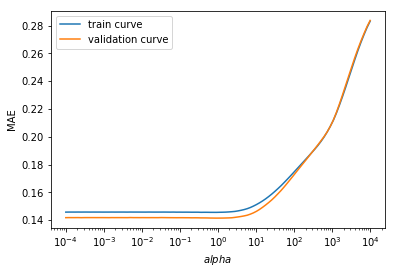

In [223]:
# Plot the validation curves
plt.semilogx(gs_results['alpha'], gs_results['train_mae'], label='train curve')
plt.semilogx(gs_results['alpha'], gs_results['val_mae'], label='validation curve')
plt.xlabel('$alpha$')
plt.ylabel('MAE')
plt.legend()
plt.show()

In [224]:
ridge = regressor.named_steps['ridge']
print('Coefficients:', ridge.coef_)
print('Intercept:', ridge.intercept_)

Coefficients: [-0.00045132  0.00126438 -0.00124744 -0.00158482 -0.00579104 -0.00918232
 -0.00170814  0.00603689  0.00790824  0.00468271  0.04084398]
Intercept: 12.009247859614403


In [150]:
y_pred = regressor.predict(X_val_simple)

In [152]:
np.abs(y_val_simple-y_pred).sum()

103.1759025659731

In [137]:
regressor.predict(X_val_simple)[:10]

array([12.01386553, 12.98792172, 11.98247   , 12.20881283, 12.35478479,
       11.82130233, 12.08328287, 12.41634237, 12.6322791 , 12.14870673])

In [138]:
y_val_simple[:10]

2008    11.908347
1843    13.122365
1020    12.037660
700     12.100718
1385    12.380030
2340    11.877576
932     12.345839
605     12.410445
2010    12.460719
1560    12.160034
Name: SalePrice, dtype: float64

In [156]:
from sklearn.metrics import mean_absolute_error as MAE

# Accuracy on the test set
print('MAE: {}'.format(MAE(y_val_simple, regressor.predict(X_val_simple))))

MAE: 0.139814620948285


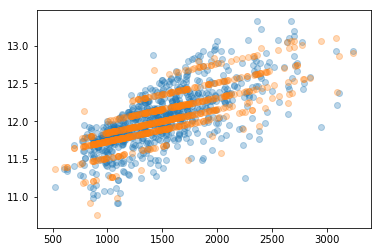

In [157]:
plt.scatter(X_val_simple['Gr Liv Area'],y_val_simple, alpha = 0.3, label = "data")
plt.scatter(X_val_simple['Gr Liv Area'],regressor.predict(X_val_simple), alpha = 0.3, label = "predictions")
plt.show()

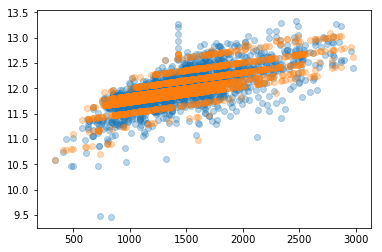

In [158]:
plt.scatter(X_tr_simple['Gr Liv Area'],y_tr_simple, alpha = 0.3, label = "data")
plt.scatter(X_tr_simple['Gr Liv Area'],regressor.predict(X_tr_simple), alpha = 0.3, label = "predictions")
plt.show()

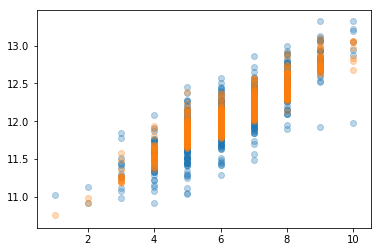

In [159]:
plt.scatter(X_val_simple['Overall Qual'].astype(int),y_val_simple, alpha = 0.3, label = "data")
plt.scatter(X_val_simple['Overall Qual'].astype(int),regressor.predict(X_val_simple), alpha = 0.3, label = "predictions")
plt.show()

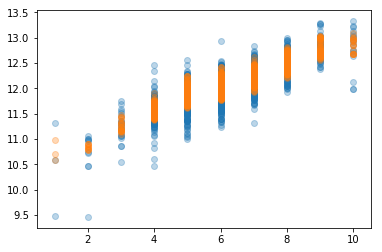

In [160]:
plt.scatter(X_tr_simple['Overall Qual'].astype(int),y_tr_simple, alpha = 0.3, label = "data")
plt.scatter(X_tr_simple['Overall Qual'].astype(int),regressor.predict(X_tr_simple), alpha = 0.3, label = "predictions")
plt.show()

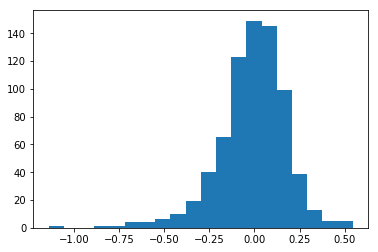

In [161]:
residuals = y_val_simple - regressor.predict(X_val_simple)
#2) residuals histogram
plt.hist(residuals, bins = 20)
plt.show()

AttributeError: module 'matplotlib.pyplot' has no attribute 'set_xlabel'

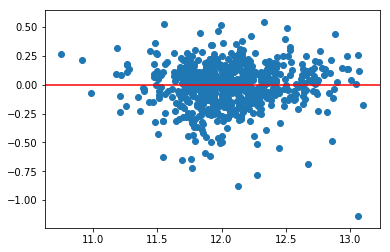

In [162]:
    #3) residuals vs fitted
plt.scatter(regressor.predict(X_val_simple), residuals )
plt.axhline(0, c = 'r')
plt.set_xlabel("Predictions")
plt.set_ylabel("Residuals")
plt.show()

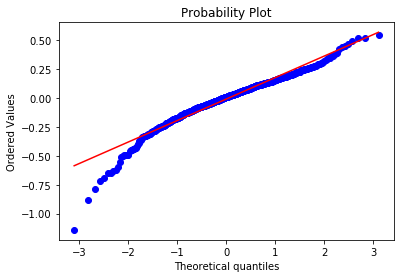

In [163]:
    
    #4) residuals qqplot
probplot(residuals, dist="norm", plot = plt);

plt.show()

In [195]:
# Intermediate model, with 2 IV: Gr Liv Area & Overall Qual
preprocessor = PandasPreprocessor()
data_tr_all = preprocessor.fit(house_clean_tr).data_
data_val_all = preprocessor.transform(house_clean_val)
inter_conti_var = ['Gr Liv Area', 'Year Built', 'Total Bsmt SF', 'Lot Area', 'Enclosed Porch']
inter_categ_var = ['Overall Qual', 'Garage Cars', 'Heating', 'Central Air', 'House Style' 'Utilities']

from itertools import chain
other_columns = list(chain.from_iterable([data_tr_all.columns[data_tr_all.columns.str.contains(id_var)].values for id_var in inter_conti_var]))
onehot_columns = list(chain.from_iterable([data_tr_all.columns[data_tr_all.columns.str.contains(id_var)].values for id_var in inter_categ_var]))

onehot_columns = onehot_columns + [id_var for id_var in other_columns if '_YN' in id_var]
other_columns = [id_var for id_var in other_columns if '_YN' not in id_var]

In [198]:

#get data
X_tr_inter = data_tr_all[onehot_columns + other_columns]
X_val_inter = data_val_all[onehot_columns + other_columns]

y_tr_inter = data_tr_all["SalePrice"]
y_val_inter = data_val_all["SalePrice"]

In [199]:
regressor.fit(X_tr_inter, y_tr_inter);

In [220]:
#tuning of the hyper parameter
# Variable to store the results
gs_results = []

# Grid search
for alpha in np.logspace(-4, 10, num=100):
    regressor.set_params(ridge__alpha=alpha)
    regressor.fit(X_tr_inter, y_tr_inter)

    # Save model and its performance on train/test sets
    gs_results.append({
        'alpha': alpha,
        'train_mae': MAE(y_tr_simple, regressor.predict(X_tr_inter)),
        'val_mae': MAE(y_val_simple, regressor.predict(X_val_inter)),
    })

# Convert results to DataFrame
gs_results = pd.DataFrame(gs_results)
gs_results.head()

,alpha,train_mae,val_mae
0,0.000100,0.145883,0.141887
1,0.000138,0.145818,0.141826
2,0.000192,0.145880,0.141910
3,0.000266,0.145873,0.141880
4,0.000368,0.145872,0.141889


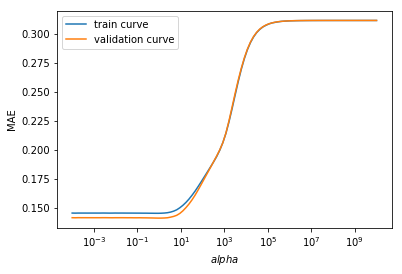

In [221]:
# Plot the validation curves
plt.semilogx(gs_results['alpha'], gs_results['train_mae'], label='train curve')
plt.semilogx(gs_results['alpha'], gs_results['val_mae'], label='validation curve')
plt.xlabel('$alpha$')
plt.ylabel('MAE')
plt.legend()
plt.show()

In [212]:
# test regression without pipeline (and without scaling?)
# Misc Val
transfo_data = house_clean_tr_noNA.copy()
transfo_data["SalePrice"] = np.log1p(transfo_data["SalePrice"])



In [214]:
lr_test = Ridge()
X_verif = transfo_data.loc[:, transfo_data.columns != 'SalePrice'].copy()
y_verif = transfo_data['SalePrice']
X_verif = pd.get_dummies(X_verif, drop_first=True)

In [215]:
lr_test.fit(X_verif, y_verif);

In [218]:
#tuning of the hyper parameter
# Variable to store the results
gs_results = []

# Grid search
for alpha in np.logspace(-4, 10, num=100):
    lr_test = Ridge(alpha)
    lr_test.fit(X_verif, y_verif)

    # Save model and its performance on train/test sets
    gs_results.append({
        'alpha': alpha,
        'train_mae': MAE(y_verif, lr_test.predict(X_verif)),
        #'val_mae': MAE(y_val_simple, regressor.predict(X_val_inter)),
    })

# Convert results to DataFrame
gs_results = pd.DataFrame(gs_results)
gs_results.head()

,alpha,train_mae
0,0.000100,0.000007
1,0.000138,0.000010
2,0.000192,0.000013
3,0.000266,0.000018
4,0.000368,0.000025


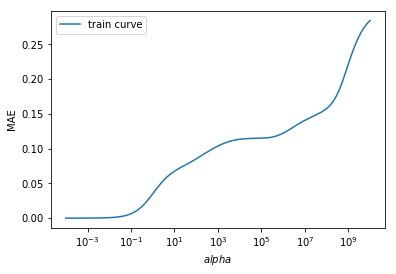

In [219]:
# Plot the validation curves
plt.semilogx(gs_results['alpha'], gs_results['train_mae'], label='train curve')
plt.xlabel('$alpha$')
plt.ylabel('MAE')
plt.legend()
plt.show()